In [116]:
#PACKAGES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from Tracer import WindField, Trajectory
from Tracer.solvers import solver_rk45, solver_euler
import xarray as xr
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import matplotlib.patches as patches
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

In [4]:
# defining paths for the three cases
filepathwd0 = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\corr nc files\flowdata_wd0.nc'
filepathwd45 = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\corr nc files\flowdata_wd45.nc'
filepathwd90 = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\corr nc files\flowdata_wd90.nc'

In [ ]:
filepath_dict = {
    "wd0": filepathwd0,
    "wd45": filepathwd45,
    "wd90": filepathwd90,
}

shot_speed = 76.44384
shot_angle = 10.4
shot_spin = 2545

U_ref = 6
z0 = 0.03
direction = 0
p_shift = 0

design_n = 10
r = 150

spin_axis = 0
dt = 0.01

baseline_values = {
    "shot_speed": shot_speed,
    "shot_angle": shot_angle,
    "shot_spin": shot_spin,
    "U_ref": U_ref,
    "direction": direction,
    "playershift": p_shift,
}

def include_baseline(values, baseline):
    values = np.array(values)
    if np.isclose(values, baseline).any():
        return np.sort(values)
    idx = np.argmin(np.abs(values - baseline))
    values[idx] = baseline
    return np.sort(values)

def is_baseline(k, v, tol=1e-8):
    return np.isclose(v, baseline_values[k], atol=tol)

def format_param(v):
    if v == 0:
        return "0"
    if abs(v) < 1e-2:
        return f"{v:.2e}"
    if abs(v) >= 1000:
        return f"{v:.0f}"
    if abs(v) >= 1:
        return f"{v:.2f}".rstrip('0').rstrip('.')
    return f"{v:.4f}".rstrip('0').rstrip('.')

def get_rotated_geometry(direction, playershift=0, r=r):
    theta = np.deg2rad(direction)

    forward = np.array([np.cos(theta), np.sin(theta)])
    lateral = np.array([-np.sin(theta), np.cos(theta)])

    base_xy = -forward * r
    shifted_xy = base_xy + lateral * playershift

    P0 = np.array([shifted_xy[0], shifted_xy[1], 0])
    return P0, direction

def transform_to_local_frame(p, direction, playershift=0):
    P0_used, _ = get_rotated_geometry(direction, playershift)
    theta = np.deg2rad(direction)

    xt = p[:, 0] - P0_used[0]
    yt = p[:, 1] - P0_used[1]

    x_local = xt * np.cos(theta) + yt * np.sin(theta)
    y_local = -xt * np.sin(theta) + yt * np.cos(theta)

    return np.column_stack((x_local, y_local, p[:, 2]))

def make_corridors():
    return (
        patches.Polygon(
            [(-106, -30), (406, -30), (406, -70), (-106, -70)],
            closed=True, facecolor='none', edgecolor='black',
            hatch='///', linewidth=1
        ),
        patches.Polygon(
            [(-106, 30), (406, 30), (406, 70), (-106, 70)],
            closed=True, facecolor='none', edgecolor='black',
            hatch='///', linewidth=1
        )
    )

def build_wind(profile, U_ref, z0, rans_file=None):
    return WindField(profile=profile, ds=rans_file, U_ref=U_ref)

def solve_profile(profile, shot_speed, shot_angle, shot_spin,
                  U_ref, z0, direction, orientation_used, P0_used, rans_file):

    wind = build_wind(profile, U_ref, z0, rans_file)

    traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation_used,
        P0=P0_used
    )

    traj.solve(solver='euler', dt=dt)
    return traj.p

def run_simulation(
    shot_speed=shot_speed,
    shot_angle=shot_angle,
    shot_spin=shot_spin,
    U_ref=U_ref,
    z0=z0,
    direction=direction,
    playershift=p_shift,
    filekey="wd0",
    profile="rans"
):

    rans_file = filepath_dict[filekey]

    P0_used, orientation_used = get_rotated_geometry(direction, playershift)

    wind = build_wind(profile, U_ref, z0, rans_file)

    traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation_used,
        P0=P0_used
    )

    traj.solve(solver='euler', dt=dt)
    return traj.p

# PARAMETER LIBRARY
parameter_library = {
    "shot_speed": {
        "values": include_baseline(np.linspace(35, 85, design_n), shot_speed),
        "name": "Shot speed",
        "unit": "m/s"
    },
    "shot_angle": {
        "values": include_baseline(np.linspace(5, 25, design_n), shot_angle),
        "name": "Shot angle",
        "unit": "deg"
    },
    "shot_spin": {
        "values": include_baseline(np.linspace(2000, 10000, design_n), shot_spin),
        "name": "Shot spin",
        "unit": "rpm"
    },
    "U_ref": {
        "values": include_baseline(np.linspace(2, 10, design_n), U_ref),
        "name": "Wind speed",
        "unit": "m/s"
    },
    "direction": {
        "values": include_baseline(np.linspace(0, 180, 2), direction),
        "name": "Wind direction",
        "unit": "deg"
    },
    "playershift": {
        "values": include_baseline(np.array([-25, -15, 0, 15, 25]), p_shift),
        "name": "Player shift",
        "unit": "m"
    }
}

In [12]:
def single_parameter_variation_shifter_demo(param_key, filekey="wd0"):

    # SETTINGS
    x_shift = 150

    shift_param = "playershift"
    shift_values = parameter_library[shift_param]["values"]
    main_values = parameter_library[param_key]["values"]

    marker_list = ['o', 'v', 's', 'P', 'D', '^', '1', '+']

    # colors represent shift
    shift_colors = plt.cm.coolwarm(np.linspace(0, 1, len(shift_values)))

    # =====================================================
    # FIGURE LAYOUT (TOP PLOTS + BOTTOM LEGENDS)
    # =====================================================

    fig = plt.figure(figsize=(13, 13))

    gs = fig.add_gridspec(
        3, 3,
        height_ratios=[1, 1, 0.35],   # bottom row reserved for legends
        width_ratios=[1, 1, 0.55],
        wspace=0.25,
        hspace=0.25
    )

    # main axes
    axes = np.empty((2, 2), dtype=object)

    axes[0, 0] = fig.add_subplot(gs[0, 0])
    axes[0, 1] = fig.add_subplot(gs[0, 1])

    axes[1, 0] = fig.add_subplot(gs[1, 0])
    axes[1, 1] = fig.add_subplot(gs[1, 1])

    # legend axis (bottom full width)
    ax_leg = fig.add_subplot(gs[2, :])
    ax_leg.axis("off")

    # STORAGE
    results = {}

    # =====================================================
    # SIMULATION LOOP
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        carry, height = [], []
        x_land, y_land = [], []

        color = shift_colors[i_shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=shift,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)
            plot_p = traj

            carry.append(plot_p[-1, 0] + x_shift)
            height.append(np.max(plot_p[:, 2]))

            x_land.append(plot_p[-1, 0] + x_shift)
            y_land.append(plot_p[-1, 1])

            # SIDE VIEW
            axes[0, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 2],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.5,
                alpha=0.85
            )

            # TOP VIEW
            axes[1, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 1],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.2,
                alpha=0.8
            )

        results[shift] = (carry, height, x_land, y_land)

    # =====================================================
    # CARRY VS HEIGHT
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]
        carry, height, _, _ = results[shift]

        for i_param in range(len(main_values)):

            marker = marker_list[i_param % len(marker_list)]

            axes[0, 1].scatter(
                carry[i_param],
                height[i_param],
                color=color,
                marker=marker,
                s=60
            )

    # =====================================================
    # LANDING POSITIONS
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]
        _, _, x_land, y_land = results[shift]

        for i_param in range(len(main_values)):

            marker = marker_list[i_param % len(marker_list)]

            axes[1, 1].scatter(
                x_land[i_param],
                y_land[i_param],
                color=color,
                marker=marker,
                s=60
            )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()
    axes[1, 0].add_patch(c1)
    axes[1, 0].add_patch(c2)

    # =====================================================
    # FORMATTING
    # =====================================================

    axes[0, 0].set_title(f"{param_key} variation with player shift")
    axes[0, 0].set_xlabel("Carry [m]")
    axes[0, 0].set_ylabel("Height [m]")
    axes[0, 0].grid()

    axes[0, 1].set_title("Carry vs Max Height")
    axes[0, 1].set_xlabel("Carry [m]")
    axes[0, 1].set_ylabel("Max Height [m]")
    axes[0, 1].grid()

    axes[1, 0].set_title("Top View")
    axes[1, 0].set_xlabel("x [m]")
    axes[1, 0].set_ylabel("y [m]")
    axes[1, 0].set_ylim(-75, 75)
    axes[1, 0].grid()

    axes[1, 1].set_title("Landing Positions")
    axes[1, 1].set_xlabel("x [m]")
    axes[1, 1].set_ylabel("y [m]")
    axes[1, 1].grid()

    # =====================================================
    # LEGENDS
    # =====================================================

    # -----------------------------------------------------
    # 1) PARAMETER LEGEND (GRAY SHAPES)
    # -----------------------------------------------------

    param_handles = []

    for i_param, v in enumerate(main_values):

        param_handles.append(
            Line2D(
                [0], [0],
                marker=marker_list[i_param % len(marker_list)],
                linestyle="None",
                markerfacecolor="lightgray",
                markeredgecolor="black",
                markersize=8,
                label=f"{format_param(v)}"
            )
        )

    legend1 = ax_leg.legend(
        handles=param_handles,
        title=f"{param_key} (shape)",
        loc="upper center",
        ncol=5,
        frameon=False
    )

    ax_leg.add_artist(legend1)

    # -----------------------------------------------------
    # 2) SHIFT LEGEND (COLORED OUTLINED SQUARES)
    # -----------------------------------------------------

    shift_handles = []

    for i_shift, shift in enumerate(shift_values):

        shift_handles.append(
            Patch(
                facecolor="none",
                edgecolor=shift_colors[i_shift],
                linewidth=2,
                label=f"shift = {format_param(shift)}"
            )
        )

    ax_leg.legend(
        handles=shift_handles,
        title="Player Shift (color)",
        loc="lower center",
        ncol=min(len(shift_values), 5),
        frameon=False
    )

    # =====================================================
    # FINAL LAYOUT TUNING
    # =====================================================

    fig.subplots_adjust(
        left=0.06,
        right=0.98,
        top=0.95,
        bottom=0.08
    )

    plt.show()

In [128]:
def single_parameter_variation_shifter_demo_2(param_key, filekey="wd0"):

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # =====================================================
    # GLOBAL FONT SETTINGS
    # =====================================================

    fs = 14
    legend_fs = 12

    plt.rcParams.update({
        "font.size": fs,
        "axes.titlesize": fs,
        "axes.labelsize": fs,
        "xtick.labelsize": fs,
        "ytick.labelsize": fs,
    })

    # SETTINGS
    x_shift = 150

    shift_param = "playershift"
    shift_values = parameter_library[shift_param]["values"]
    main_values = parameter_library[param_key]["values"]

    marker_list = ['x', 'v', 's', 'P', 'D', '^', 'o', '+']
    shift_colors = plt.cm.coolwarm(np.linspace(0, 1, len(shift_values)))

    # =====================================================
    # FIGURE LAYOUT (FIXED LEGEND SPACE)
    # =====================================================

    fig = plt.figure(figsize=(12, 10))

    gs = fig.add_gridspec(
        3, 2,
        height_ratios=[1, 1, 0.60],   # ⬅️ MORE SPACE FOR LEGENDS
        hspace=0.25,
        wspace=0.25
    )

    axes = np.empty((2, 2), dtype=object)

    axes[0, 0] = fig.add_subplot(gs[0, 0])
    axes[0, 1] = fig.add_subplot(gs[0, 1])
    axes[1, 0] = fig.add_subplot(gs[1, 0])
    axes[1, 1] = fig.add_subplot(gs[1, 1])

    # =====================================================
    # SPLIT LEGEND AREA INTO TWO REAL AXES (NO OVERLAP)
    # =====================================================

    leg_gs = gs[2, :].subgridspec(2, 1, hspace=0.6)

    ax_leg1 = fig.add_subplot(leg_gs[0, 0])
    ax_leg2 = fig.add_subplot(leg_gs[1, 0])

    ax_leg1.axis("off")
    ax_leg2.axis("off")

    # STORAGE
    results = {}

    # =====================================================
    # SIMULATION LOOP
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        carry, height = [], []
        x_land, y_land = [], []

        color = shift_colors[i_shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=shift,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)
            plot_p = traj

            carry.append(plot_p[-1, 0] + x_shift)
            height.append(np.max(plot_p[:, 2]))

            x_land.append(plot_p[-1, 0] + x_shift)
            y_land.append(plot_p[-1, 1])

            axes[0, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 2],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.5,
                alpha=0.85
            )

            axes[1, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 1],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.2,
                alpha=0.8
            )

        results[shift] = (carry, height, x_land, y_land)

    # =====================================================
    # SCATTER PLOTS
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]
        carry, height, _, _ = results[shift]

        for i_param in range(len(main_values)):

            marker = marker_list[i_param % len(marker_list)]

            axes[0, 1].scatter(carry[i_param], height[i_param],
                               color=color, marker=marker, s=60)

            axes[1, 1].scatter(
                results[shift][2][i_param],
                results[shift][3][i_param],
                color=color, marker=marker, s=60
            )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()
    axes[1, 0].add_patch(c1)
    axes[1, 0].add_patch(c2)

    # =====================================================
    # FORMATTING
    # =====================================================

    for ax in axes.flat:
        ax.tick_params(labelsize=fs)

    axes[0, 0].set_title(f"{parameter_library[param_key]['name']} variation with player shift")
    axes[0, 0].set_ylabel("Height [m]")
    axes[0, 0].grid()

    axes[0, 1].set_title("Carry vs Max Height")
    axes[0, 1].set_ylabel("Max Height [m]")
    axes[0, 1].grid()

    axes[1, 0].set_title("Top View")
    axes[1, 0].set_xlabel("x [m]")
    axes[1, 0].set_ylabel("y [m]")
    axes[1, 0].set_ylim(-75, 75)
    axes[1, 0].grid()

    axes[1, 1].set_title("Landing Positions")
    axes[1, 1].set_xlabel("x [m]")
    axes[1, 1].set_ylabel("y [m]")
    axes[1, 1].grid()

    # =====================================================
    # LEGEND 1: PARAMETER (LARGE GREY MARKERS)
    # =====================================================

    param_handles = [
        Line2D(
            [0], [0],
            marker=marker_list[i % len(marker_list)],
            linestyle="None",
            markerfacecolor="lightgray",
            markeredgecolor="black",
            markeredgewidth=1.2,
            markersize=12,   # ⬅️ BIGGER
            label=f"{format_param(v)}"
        )
        for i, v in enumerate(main_values)
    ]

    ax_leg1.legend(
        handles=param_handles,
        title=f"{parameter_library[param_key]['name']} [{parameter_library[param_key]['unit']}]",
        loc="center",
        ncol=10,
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=fs
    )

    # =====================================================
    # LEGEND 2: SHIFT (LARGE COLORED SQUARES, BLACK BORDER)
    # =====================================================

    shift_handles = [
        Line2D(
            [0], [0],
            marker='s',
            linestyle="None",
            markerfacecolor=shift_colors[i],
            markeredgecolor="black",
            markeredgewidth=1.2,
            markersize=12,   # ⬅️ BIGGER
            label=f"shift = {format_param(s)} m"
        )
        for i, s in enumerate(shift_values)
    ]

    ax_leg2.legend(
        handles=shift_handles,
        title="Player Shift [m]",
        loc="center",
        ncol=min(len(shift_values), 5),
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=fs
    )

    # =====================================================
    # FINAL LAYOUT TUNING
    # =====================================================

    fig.subplots_adjust(
        left=0.06,
        right=0.98,
        top=0.95,
        bottom=0.22
    )

    plt.show()

In [6]:
def single_parameter_variation(param_key, filekey="wd0"):

    p = parameter_library[param_key]
    values = p["values"]

    results = []
    param_values = []

    carry, height = [], []
    x_land, y_land = [], []

    for v in values:

        kwargs = dict(
            shot_speed=shot_speed,
            shot_angle=shot_angle,
            shot_spin=shot_spin,
            U_ref=U_ref,
            z0=z0,
            direction=direction,
            playershift=p_shift,
            profile="rans",
            filekey=filekey
        )

        kwargs[param_key] = v

        traj = run_simulation(**kwargs)

        direction_used = v if param_key == "direction" else direction

        plot_p = transform_to_local_frame(
            traj,
            direction_used,
            kwargs["playershift"]
        )

        results.append(plot_p)
        param_values.append(v)

        carry.append(plot_p[-1, 0])
        height.append(np.max(plot_p[:, 2]))
        x_land.append(plot_p[-1, 0])
        y_land.append(plot_p[-1, 1])

    # PLOT
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(results)))

    # Side view
    for i, plot_p in enumerate(results):
        if is_baseline(param_key, param_values[i]):
            axes[0,0].plot(
                plot_p[:,0], plot_p[:,2],
                color='black',
                linewidth=3,
                label=f'B {param_key} = {format_param(param_values[i])}'
            )
        else:
            axes[0,0].plot(
                plot_p[:,0], plot_p[:,2],
                color=colors[i],
                linestyle='--',
                label=f"{param_key} = {format_param(param_values[i])}"
        )

    axes[0,0].set_title("Trajectory side view")
    axes[0,0].set_xlabel("Carry distance (m)")
    axes[0,0].set_ylabel("Height (m)")
    axes[0,0].grid()
    axes[0,0].legend()

    # Carry vs height
    for i in range(len(results)):
        axes[0,1].scatter(carry[i], height[i], color=colors[i])
        axes[0,1].text(carry[i], height[i], format_param(param_values[i]), fontsize=8)

    axes[0,1].set_title("Carry vs Max height")
    axes[0,1].set_xlabel("Carry (m)")
    axes[0,1].set_ylabel("Max height (m)")
    axes[0,1].grid()

    # Top view
    for i, plot_p in enumerate(results):
        axes[1,0].plot(plot_p[:,0], plot_p[:,1], color=colors[i])

    c1, c2 = make_corridors()
    axes[1,0].add_patch(c1)
    axes[1,0].add_patch(c2)
    axes[1,0].set_ylim(-75, 75)
    axes[1,0].set_title("Trajectory top down view")
    axes[1,0].set_xlabel("Longitudinal Carry (m)")
    axes[1,0].set_ylabel("Transverse Carry (m)")
    axes[1,0].grid()

    # Landing
    for i in range(len(results)):
        axes[1,1].scatter(x_land[i], y_land[i], color=colors[i])
        axes[1,1].text(x_land[i], y_land[i], format_param(param_values[i]), fontsize=8)

    axes[1,1].set_title("Landing position ")
    axes[1,1].set_ylim(-35,35)
    axes[1,1].set_xlabel("landing position $x$ (m)")
    axes[1,1].set_ylabel("landing position $y$ (m)")
    axes[1,1].grid()

    plt.tight_layout()
    plt.show()

## Corridor wind field visualisation

### Visualisation of corridor with $\psi=0^\circ$

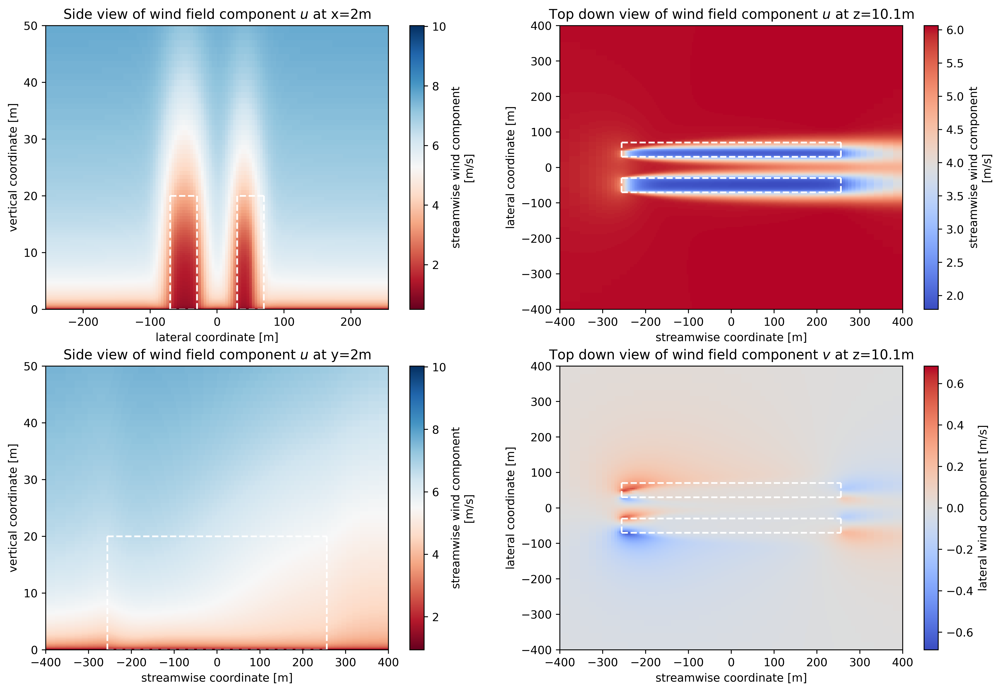

In [ ]:
# Visualisation script for psi=0
filepath_corr = filepathwd0

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

fig, ax = plt.subplots(2, 2, figsize=(15, 10), dpi=500)

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
U_slice = corr_wf.ds.U.isel(x=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="y",
    y="z",
    ax=ax[0,0],
    cmap="RdBu",
)

ax[0,0].set_xlim(-256, 256)
ax[0,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[0,0].plot([-70,-30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([-70,-30], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[0,0].plot([-70,-70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([-30,-30], [0, 20], color=color, linestyle=linestyle)

# horisontal lines
ax[0,0].plot([70,30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([70,30], [20, 20], color=color, linestyle=linestyle)

# vertical lines
ax[0,0].plot([70,70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([30,30], [0, 20], color=color, linestyle=linestyle)

ax[0,0].set_title('Side view of wind field component $u$ at x=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.U.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[0,1],
    cmap="coolwarm",
)

ax[0,1].set_xlim(-400, 400)
ax[0,1].set_ylim(-400, 400)
ax[0,1].set_title('Top down view of wind field component $u$ at z=10.1m')

ax[0,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[0,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[0,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[0,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)

# bottom row
U_slice = corr_wf.ds.U.isel(y=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="x",
    y="z",
    ax=ax[1,0],
    cmap="RdBu",
)

ax[1,0].set_xlim(-400, 400)
ax[1,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[1,0].plot([-256,256], [0, 0], color=color, linestyle=linestyle)
ax[1,0].plot([-256, 256], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[1,0].plot([-256,-256], [0, 20], color=color, linestyle=linestyle)
ax[1,0].plot([256,256], [0, 20], color=color, linestyle=linestyle)

ax[1,0].set_title('Side view of wind field component $u$ at y=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.V.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[1,1],
    cmap="coolwarm",
)

ax[1,1].set_xlim(-400, 400)
ax[1,1].set_ylim(-400, 400)
ax[1,1].set_title('Top down view of wind field component $v$ at z=10.1m')

ax[1,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[1,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[1,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[1,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)



plt.show()

### Slices inside corridor at $\psi=0^\circ$

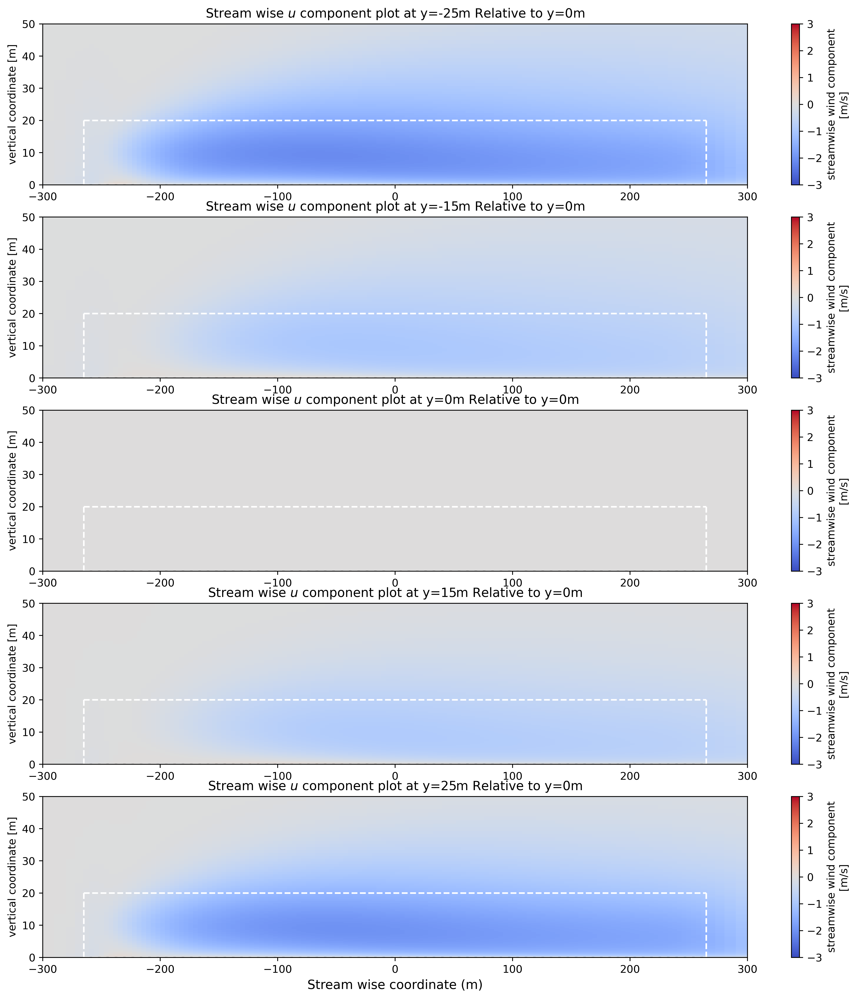

In [63]:
filepath_corr = filepathwd0

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

fig, ax = plt.subplots(5, 1, figsize=(15, 16),dpi=500)

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
slices_low = np.array([89,91,95,99,101])
slices_high = np.array([90,92,96,100,102]) 
names = ['y=-25m', 'y=-15m', 'y=0m', 'y=15m', 'y=25m']

for i in range(len(slices_high)):

    U_slice_high = corr_wf.ds.U.isel(y=slices_high[i])
    U_slice_low = corr_wf.ds.U.isel(y=slices_low[i])
    U_slice = (U_slice_high+ U_slice_low)/2

    U_slice_m2m = corr_wf.ds.U.isel(y=95)
    U_slice_p2m = corr_wf.ds.U.isel(y=96)
    U_slice_ref = (U_slice_p2m + U_slice_m2m) / 2

    #U_slice_ref = corr_wf.ds.U.isel(y=96)
    U_diff = U_slice - U_slice_ref
    U_diff.plot(
        x="x",
        y="z",
        ax=ax[i],
        cmap="coolwarm",
        vmax=3,
        vmin=-3
    )
    ax[i].set_xlim(-300, 300)
    ax[i].set_ylim(0, 50)
    ax[i].set_xlabel(' ')
    ax[i].set_title(f'Stream wise $u$ component plot at {names[i]} Relative to y=0m')
    color = 'white'
    linestyle = '--'

    ax[i].plot([-265,265], [0, 0], color=color, linestyle=linestyle)
    ax[i].plot([-265,265], [20, 20], color=color, linestyle=linestyle)
    # vertical lines
    ax[i].plot([-265,-265], [0, 20], color=color, linestyle=linestyle)
    ax[i].plot([265,265], [0, 20], color=color, linestyle=linestyle)
    #ax[0,0].set_title('Side view of wind field component U at x=2 [m]')

ax[4].set_xlabel('Stream wise coordinate (m)',fontsize=12)

plt.show()

### Visualisation of corridor with $\psi=45^\circ$

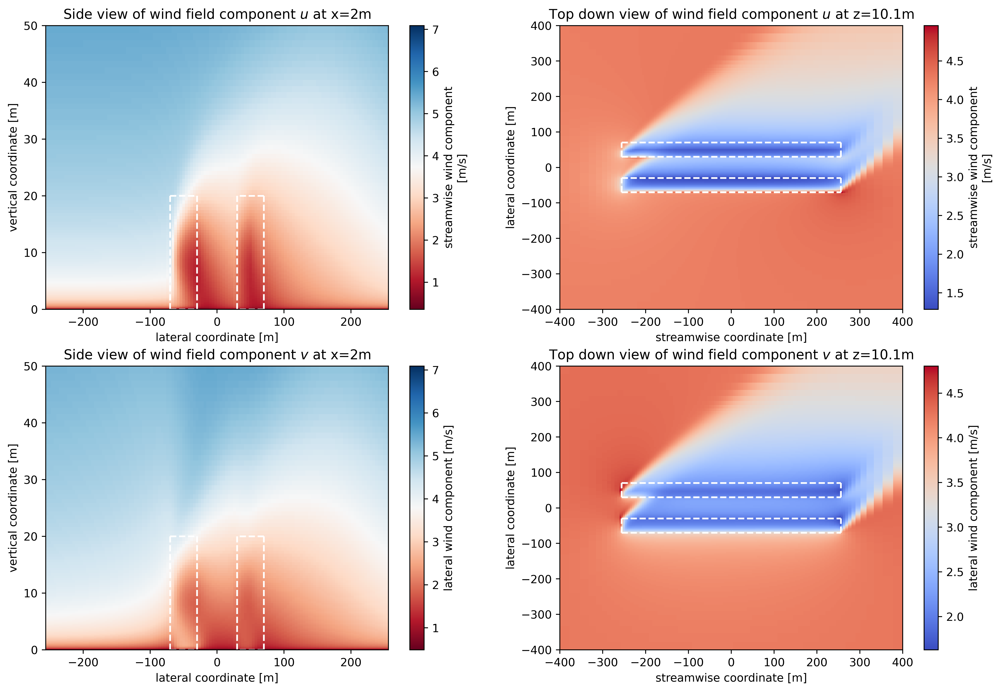

In [54]:
filepath_corr = filepathwd45

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

fig, ax = plt.subplots(2, 2, figsize=(15, 10),dpi=500)

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
U_slice = corr_wf.ds.U.isel(x=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="y",
    y="z",
    ax=ax[0,0],
    cmap="RdBu",
)

ax[0,0].set_xlim(-256, 256)
ax[0,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[0,0].plot([-70,-30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([-70,-30], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[0,0].plot([-70,-70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([-30,-30], [0, 20], color=color, linestyle=linestyle)

# horisontal lines
ax[0,0].plot([70,30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([70,30], [20, 20], color=color, linestyle=linestyle)

# vertical lines
ax[0,0].plot([70,70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([30,30], [0, 20], color=color, linestyle=linestyle)

ax[0,0].set_title('Side view of wind field component $u$ at x=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.U.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[0,1],
    cmap="coolwarm",
)

ax[0,1].set_xlim(-400, 400)
ax[0,1].set_ylim(-400, 400)
ax[0,1].set_title('Top down view of wind field component $u$ at z=10.1m')

ax[0,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[0,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[0,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[0,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)

# bottom row

U_slice = corr_wf.ds.V.isel(x=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="y",
    y="z",
    ax=ax[1,0],
    cmap="RdBu",
)

ax[1,0].set_xlim(-256, 256)
ax[1,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[1,0].plot([-70,-30], [0, 0], color=color, linestyle=linestyle)
ax[1,0].plot([-70,-30], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[1,0].plot([-70,-70], [0, 20], color=color, linestyle=linestyle)
ax[1,0].plot([-30,-30], [0, 20], color=color, linestyle=linestyle)

# horisontal lines
ax[1,0].plot([70,30], [0, 0], color=color, linestyle=linestyle)
ax[1,0].plot([70,30], [20, 20], color=color, linestyle=linestyle)

# vertical lines
ax[1,0].plot([70,70], [0, 20], color=color, linestyle=linestyle)
ax[1,0].plot([30,30], [0, 20], color=color, linestyle=linestyle)

ax[1,0].set_title('Side view of wind field component $v$ at x=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.V.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[1,1],
    cmap="coolwarm",
)

ax[1,1].set_xlim(-400, 400)
ax[1,1].set_ylim(-400, 400)
ax[1,1].set_title('Top down view of wind field component $v$ at z=10.1m')

ax[1,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[1,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[1,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[1,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)

plt.show()

### Slices inside corridor at $\psi=45^\circ$

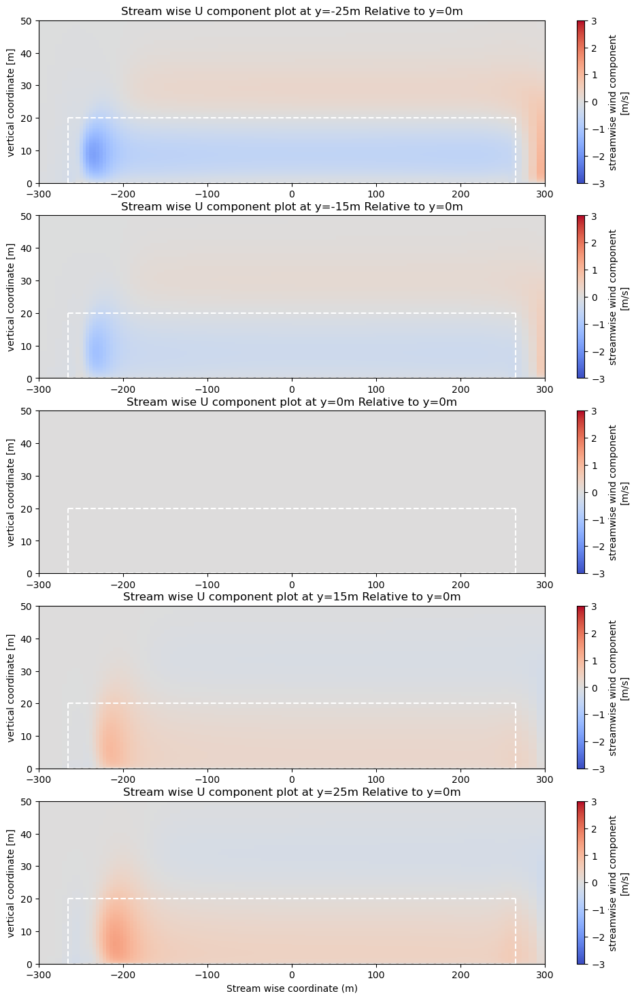

In [8]:
filepath_corr = filepathwd45

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

fig, ax = plt.subplots(5, 1, figsize=(12, 18))

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
slices_low = np.array([89,91,95,99,101])
slices_high = np.array([90,92,96,100,102]) 
names = ['y=-25m', 'y=-15m', 'y=0m', 'y=15m', 'y=25m']

for i in range(len(slices_high)):

    U_slice_high = corr_wf.ds.U.isel(y=slices_high[i])
    U_slice_low = corr_wf.ds.U.isel(y=slices_low[i])
    U_slice = (U_slice_high+ U_slice_low)/2

    U_slice_m2m = corr_wf.ds.U.isel(y=95)
    U_slice_p2m = corr_wf.ds.U.isel(y=96)
    U_slice_ref = (U_slice_p2m + U_slice_m2m) / 2

    #U_slice_ref = corr_wf.ds.U.isel(y=96)
    U_diff = U_slice - U_slice_ref
    U_diff.plot(
        x="x",
        y="z",
        ax=ax[i],
        cmap="coolwarm",
        vmax=3,
        vmin=-3
    )
    ax[i].set_xlim(-300, 300)
    ax[i].set_ylim(0, 50)
    ax[i].set_xlabel(' ')
    ax[i].set_title(f'Stream wise U component plot at {names[i]} Relative to y=0m')
    color = 'white'
    linestyle = '--'

    ax[i].plot([-265,265], [0, 0], color=color, linestyle=linestyle)
    ax[i].plot([-265,265], [20, 20], color=color, linestyle=linestyle)
    # vertical lines
    ax[i].plot([-265,-265], [0, 20], color=color, linestyle=linestyle)
    ax[i].plot([265,265], [0, 20], color=color, linestyle=linestyle)
    #ax[0,0].set_title('Side view of wind field component U at x=2 [m]')

ax[4].set_xlabel('Stream wise coordinate (m)')

plt.show()

### Visualisation of corridor with $\psi=90^\circ$

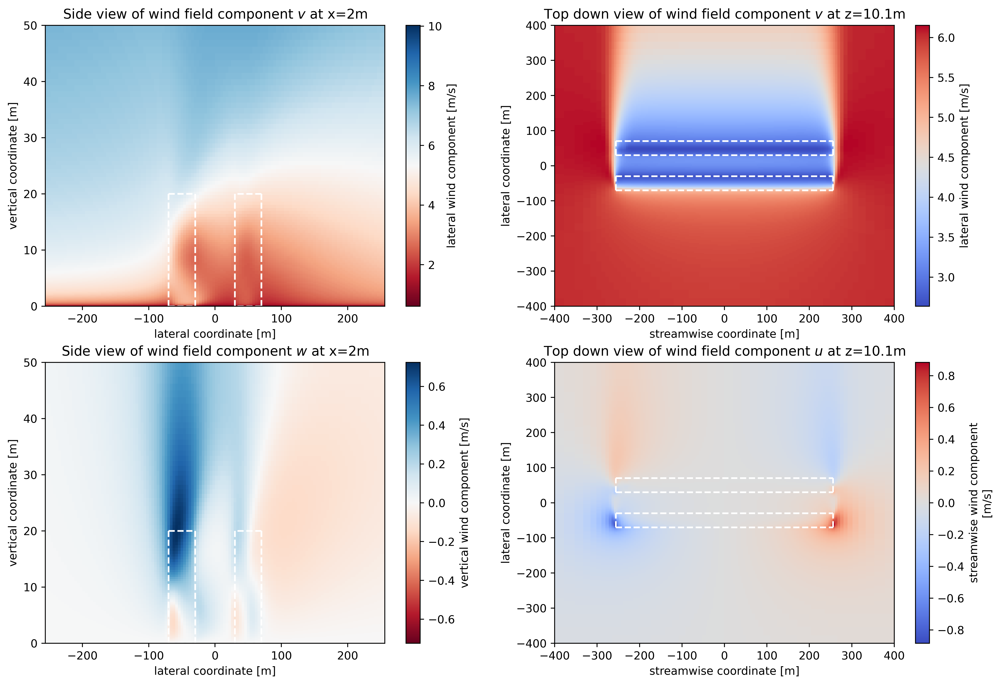

In [60]:
filepath_corr = filepathwd90

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

fig, ax = plt.subplots(2, 2, figsize=(15, 10),dpi=500)

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
U_slice = corr_wf.ds.V.isel(x=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="y",
    y="z",
    ax=ax[0,0],
    cmap="RdBu",
)

ax[0,0].set_xlim(-256, 256)
ax[0,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[0,0].plot([-70,-30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([-70,-30], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[0,0].plot([-70,-70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([-30,-30], [0, 20], color=color, linestyle=linestyle)

# horisontal lines
ax[0,0].plot([70,30], [0, 0], color=color, linestyle=linestyle)
ax[0,0].plot([70,30], [20, 20], color=color, linestyle=linestyle)

# vertical lines
ax[0,0].plot([70,70], [0, 20], color=color, linestyle=linestyle)
ax[0,0].plot([30,30], [0, 20], color=color, linestyle=linestyle)

ax[0,0].set_title('Side view of wind field component $v$ at x=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.V.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[0,1],
    cmap="coolwarm",
)

ax[0,1].set_xlim(-400, 400)
ax[0,1].set_ylim(-400, 400)
ax[0,1].set_title('Top down view of wind field component $v$ at z=10.1m')

ax[0,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[0,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[0,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[0,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[0,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[0,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)

# bottom row

U_slice = corr_wf.ds.W.isel(x=96) # y=96 corresponds to y=2 [m]

U_slice.plot(
    x="y",
    y="z",
    ax=ax[1,0],
    cmap="RdBu",
)

ax[1,0].set_xlim(-256, 256)
ax[1,0].set_ylim(0, 50)

# making a box to indicate the corridor area with corners at (-70, 0), (-30, 0), (-70, 20), (-30, 20)
# horisontal lines
color = 'white'
linestyle = '--'

ax[1,0].plot([-70,-30], [0, 0], color=color, linestyle=linestyle)
ax[1,0].plot([-70,-30], [20, 20], color=color, linestyle=linestyle)
# vertical lines
ax[1,0].plot([-70,-70], [0, 20], color=color, linestyle=linestyle)
ax[1,0].plot([-30,-30], [0, 20], color=color, linestyle=linestyle)

# horisontal lines
ax[1,0].plot([70,30], [0, 0], color=color, linestyle=linestyle)
ax[1,0].plot([70,30], [20, 20], color=color, linestyle=linestyle)

# vertical lines
ax[1,0].plot([70,70], [0, 20], color=color, linestyle=linestyle)
ax[1,0].plot([30,30], [0, 20], color=color, linestyle=linestyle)

ax[1,0].set_title('Side view of wind field component $w$ at x=2m')
# =========================
# MIDDLE: Y-Z (SIDE DRIFT)
# =========================
U_slice = corr_wf.ds.U.isel(z=49) # z=49 corresponds to z=10.1[m]

U_slice.plot(
    x="x",
    y="y",
    ax=ax[1,1],
    cmap="coolwarm",
)

ax[1,1].set_xlim(-400, 400)
ax[1,1].set_ylim(-400, 400)
ax[1,1].set_title('Top down view of wind field component $u$ at z=10.1m')

ax[1,1].plot([-256,256], [-70, -70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [-30, -30], color=color, linestyle=linestyle)
# vertical lines
ax[1,1].plot([-256,-256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([-256,-256], [30, 70], color=color, linestyle=linestyle)

# horisontal lines
ax[1,1].plot([-256,256], [70, 70], color=color, linestyle=linestyle)
ax[1,1].plot([-256,256], [30, 30], color=color, linestyle=linestyle)

# vertical lines
ax[1,1].plot([256,256], [-70, -30], color=color, linestyle=linestyle)
ax[1,1].plot([256,256], [30, 70], color=color, linestyle=linestyle)

plt.show()

### Slices inside corridor at $\psi=90^\circ$

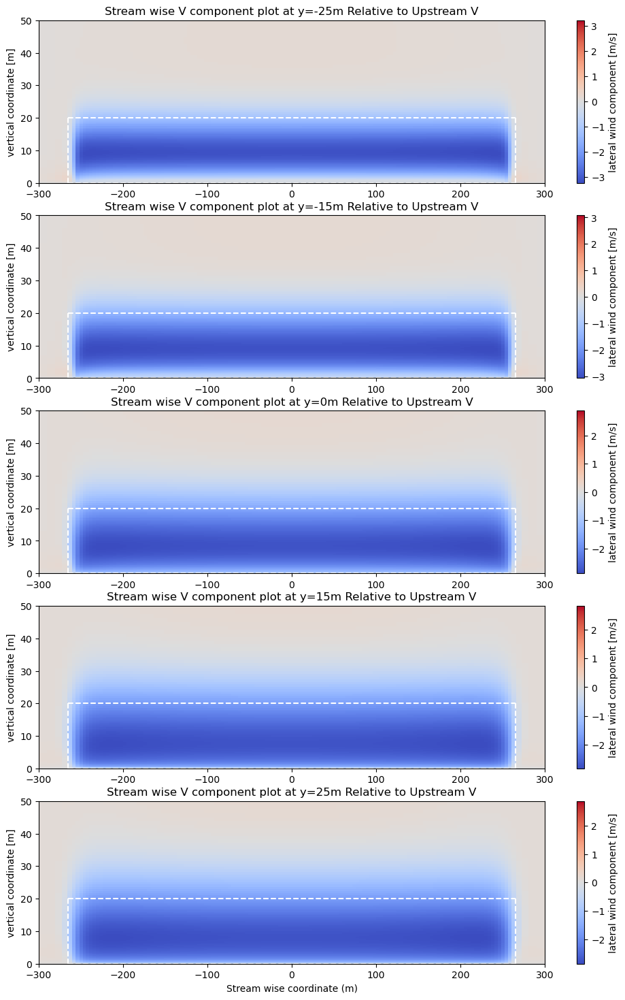

In [ ]:
filepath_corr = filepathwd90

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)


fig, ax = plt.subplots(5, 1, figsize=(12, 18),dpi=500)

# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
slices_low = np.array([89,91,95,99,101])
slices_high = np.array([90,92,96,100,102]) 
names = ['y=-25m', 'y=-15m', 'y=0m', 'y=15m', 'y=25m']

for i in range(len(slices_high)):

    V_slice_high = corr_wf.ds.V.isel(y=slices_high[i])
    V_slice_low = corr_wf.ds.V.isel(y=slices_low[i])
    V_slice = (V_slice_high+ V_slice_low)/2

    V_slice_m2m = corr_wf.ds.V.isel(y=0)
    V_slice_p2m = corr_wf.ds.V.isel(y=1)
    V_slice_ref = (V_slice_p2m + V_slice_m2m) / 2

    #U_slice_ref = corr_wf.ds.U.isel(y=96)
    V_diff = V_slice - V_slice_ref
    V_diff.plot(
        x="x",
        y="z",
        ax=ax[i],
        cmap="coolwarm",
    )
    ax[i].set_xlim(-300, 300)
    ax[i].set_ylim(0, 50)
    ax[i].set_xlabel(' ')
    ax[i].set_title(f'Stream wise $v$ component plot at {names[i]} Relative to Upstream V')
    color = 'white'
    linestyle = '--'

    ax[i].plot([-265,265], [0, 0], color=color, linestyle=linestyle)
    ax[i].plot([-265,265], [20, 20], color=color, linestyle=linestyle)
    # vertical lines
    ax[i].plot([-265,-265], [0, 20], color=color, linestyle=linestyle)
    ax[i].plot([265,265], [0, 20], color=color, linestyle=linestyle)
    #ax[0,0].set_title('Side view of wind field component U at x=2 [m]')

ax[4].set_xlabel('Stream wise coordinate (m)')

plt.show()

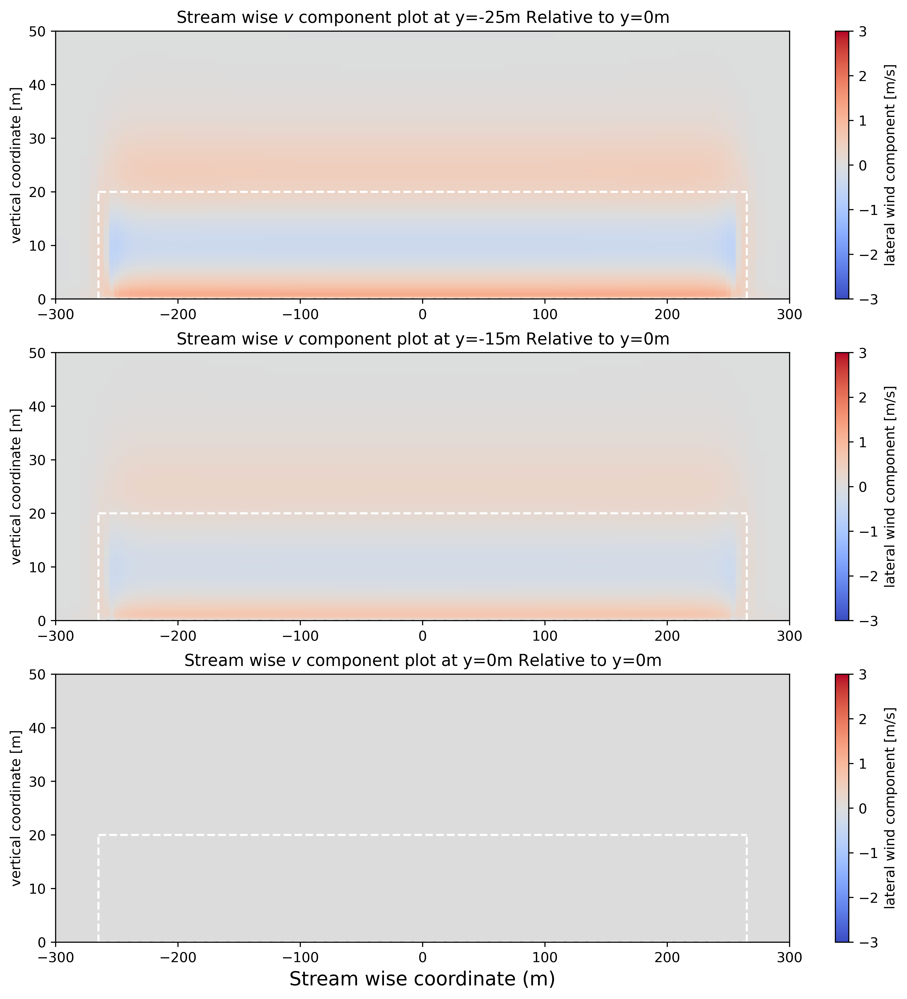

In [76]:
filepath_corr = filepathwd90

U_ref = 6
r = 100
corr_wf = WindField(profile='rans',ds=filepath_corr, U_ref=U_ref)

#fig, ax = plt.subplots(5, 1, figsize=(12, 18),dpi=500)
fig, ax = plt.subplots(3, 1, figsize=(12, 12),dpi=500)
# =========================
# LEFT: X-Z (CARRY PROFILE)
# =========================
#slices_low = np.array([89,91,95,99,101])
#slices_high = np.array([90,92,96,100,102]) 
#names = ['y=-25m', 'y=-15m', 'y=0m', 'y=15m', 'y=25m']

slices_low = np.array([89,91,95])
slices_high = np.array([90,92,96]) 
names = ['y=-25m', 'y=-15m', 'y=0m']

for i in range(len(slices_high)):

    V_slice_high = corr_wf.ds.V.isel(y=slices_high[i])
    V_slice_low = corr_wf.ds.V.isel(y=slices_low[i])
    V_slice = (V_slice_high+ V_slice_low)/2

    V_slice_m2m = corr_wf.ds.V.isel(y=95)
    V_slice_p2m = corr_wf.ds.V.isel(y=96)
    V_slice_ref = (V_slice_p2m + V_slice_m2m) / 2

    #U_slice_ref = corr_wf.ds.U.isel(y=96)
    V_diff = V_slice - V_slice_ref
    V_diff.plot(
        x="x",
        y="z",
        ax=ax[i],
        cmap="coolwarm",
        vmax=3,
        vmin=-3
    )
    ax[i].set_xlim(-300, 300)
    ax[i].set_ylim(0, 50)
    ax[i].set_xlabel(' ')
    ax[i].set_title(f'Stream wise $v$ component plot at {names[i]} Relative to y=0m')
    color = 'white'
    linestyle = '--'

    ax[i].plot([-265,265], [0, 0], color=color, linestyle=linestyle)
    ax[i].plot([-265,265], [20, 20], color=color, linestyle=linestyle)
    # vertical lines
    ax[i].plot([-265,-265], [0, 20], color=color, linestyle=linestyle)
    ax[i].plot([265,265], [0, 20], color=color, linestyle=linestyle)
    #ax[0,0].set_title('Side view of wind field component U at x=2 [m]')

ax[2].set_xlabel('Stream wise coordinate (m)',fontsize=14)

plt.show()

## Trajectories in corridor terrain

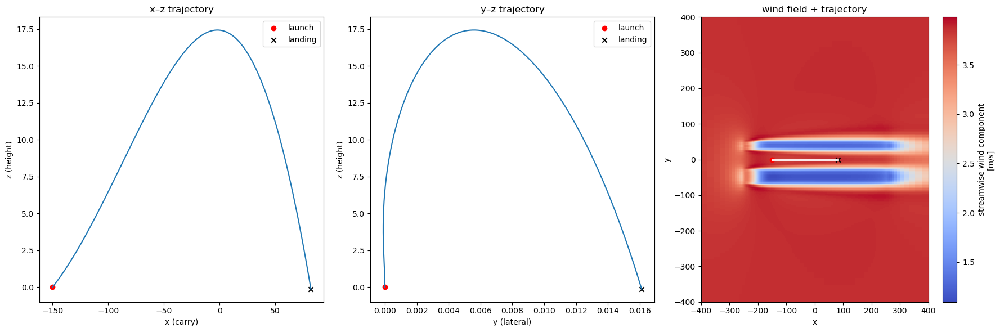

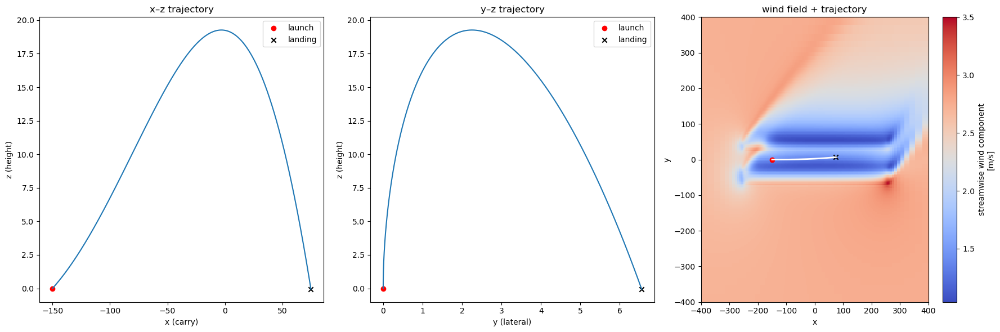

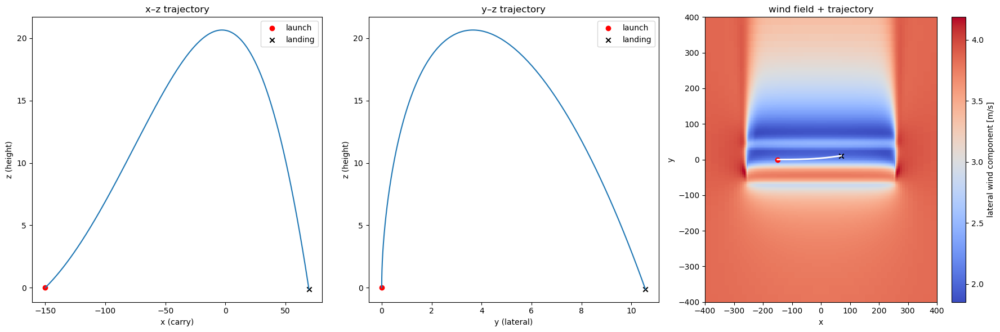

In [12]:
filepath = filepathwd0

U_ref = 6
dist = 150
corr_wf = WindField(profile='rans',ds=filepath, U_ref=U_ref)


# play field parameters - these make up the baseline shot
P0=np.array([-dist, 0, 0])
dt = 0.01       # time step

# Basis shot parameters - if not otherwise specified, these are used
shot_speed = 76.44384   # intital velocity
shot_angle = 5.4       # initial angle for trajectory	
shot_spin = 2545        # initial spin
spin_axis = 0           # spin axis adding impurity to the spin
orientation = 0        # play direction

# Basis wind parameters - if not otherwise specified, these are used
U_ref = 6      # reference wind speed at 10 meters above ground (6 m/s is approx. danish average)
z0 = 0.03       # surface roughness
direction = 0   # wind direction (0 is tailwind, 180 is headwind)

wind = corr_wf

traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation,
        P0=P0
    )
traj.solve(solver='euler', dt=dt)



# plot
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# left plot (x,z trajectory)
ax[0].plot(traj.p[:, 0], traj.p[:, 2])

ax[0].scatter(traj.p[0, 0], traj.p[0, 2],
              color='red', label='launch')

ax[0].scatter(traj.p[-1, 0], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[0].set_xlabel('x (carry)')
ax[0].set_ylabel('z (height)')
ax[0].set_title('x–z trajectory')
ax[0].legend()

# middle plot (y,z trajectory)
ax[1].plot(traj.p[:, 1], traj.p[:, 2])

ax[1].scatter(traj.p[0, 1], traj.p[0, 2],
              color='red', label='launch')

ax[1].scatter(traj.p[-1, 1], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[1].set_xlabel('y (lateral)')
ax[1].set_ylabel('z (height)')
ax[1].set_title('y–z trajectory')
ax[1].legend()

# right plot (top down trajectory on top of heatplot of U)
U_slice = corr_wf.ds.U.isel(z=10)

U_slice.plot(
    x="x",
    y="y",
    ax=ax[2],
    cmap="coolwarm",
    add_colorbar=True
)

ax[2].plot(traj.p[:, 0], traj.p[:, 1],
           color='white', linewidth=2, label='trajectory')

ax[2].scatter(traj.p[0, 0], traj.p[0, 1],
              color='red')

ax[2].scatter(traj.p[-1, 0], traj.p[-1, 1],
              color='black', marker='x')

ax[2].set_xlim(-400, 400)
ax[2].set_ylim(-400, 400)
ax[2].set_xlabel('x')
ax[2].set_ylabel('y')
ax[2].set_title('wind field + trajectory')

plt.tight_layout()
plt.show()

filepath = filepathwd45

U_ref = 6
dist = 150
corr_wf = WindField(profile='rans',ds=filepath, U_ref=U_ref)


# play field parameters - these make up the baseline shot
P0=np.array([-dist, 0, 0])
dt = 0.01       # time step

# Basis shot parameters - if not otherwise specified, these are used
shot_speed = 76.44384   # intital velocity
shot_angle = 5.4       # initial angle for trajectory	
shot_spin = 2545        # initial spin
spin_axis = 0           # spin axis adding impurity to the spin
orientation = 0        # play direction

# Basis wind parameters - if not otherwise specified, these are used
U_ref = 6      # reference wind speed at 10 meters above ground (6 m/s is approx. danish average)
z0 = 0.03       # surface roughness
direction = 0   # wind direction (0 is tailwind, 180 is headwind)

wind = corr_wf

traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation,
        P0=P0
    )
traj.solve(solver='euler', dt=dt)



# plot
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# left plot (x,z trajectory)
ax[0].plot(traj.p[:, 0], traj.p[:, 2])

ax[0].scatter(traj.p[0, 0], traj.p[0, 2],
              color='red', label='launch')

ax[0].scatter(traj.p[-1, 0], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[0].set_xlabel('x (carry)')
ax[0].set_ylabel('z (height)')
ax[0].set_title('x–z trajectory')
ax[0].legend()

# middle plot (y,z trajectory)
ax[1].plot(traj.p[:, 1], traj.p[:, 2])

ax[1].scatter(traj.p[0, 1], traj.p[0, 2],
              color='red', label='launch')

ax[1].scatter(traj.p[-1, 1], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[1].set_xlabel('y (lateral)')
ax[1].set_ylabel('z (height)')
ax[1].set_title('y–z trajectory')
ax[1].legend()

# right plot (top down trajectory on top of heatplot of U)
U_slice = corr_wf.ds.U.isel(z=10)

U_slice.plot(
    x="x",
    y="y",
    ax=ax[2],
    cmap="coolwarm",
    add_colorbar=True
)

ax[2].plot(traj.p[:, 0], traj.p[:, 1],
           color='white', linewidth=2, label='trajectory')

ax[2].scatter(traj.p[0, 0], traj.p[0, 1],
              color='red')

ax[2].scatter(traj.p[-1, 0], traj.p[-1, 1],
              color='black', marker='x')

ax[2].set_xlim(-400, 400)
ax[2].set_ylim(-400, 400)
ax[2].set_xlabel('x')
ax[2].set_ylabel('y')
ax[2].set_title('wind field + trajectory')

plt.tight_layout()
plt.show()

filepath = filepathwd90

U_ref = 6
dist = 150
corr_wf = WindField(profile='rans',ds=filepath, U_ref=U_ref)


# play field parameters - these make up the baseline shot
P0=np.array([-dist, 0, 0])
dt = 0.01       # time step

# Basis shot parameters - if not otherwise specified, these are used
shot_speed = 76.44384   # intital velocity
shot_angle = 5.4       # initial angle for trajectory	
shot_spin = 2545        # initial spin
spin_axis = 0           # spin axis adding impurity to the spin
orientation = 0        # play direction

# Basis wind parameters - if not otherwise specified, these are used
U_ref = 6      # reference wind speed at 10 meters above ground (6 m/s is approx. danish average)
z0 = 0.03       # surface roughness
direction = 0   # wind direction (0 is tailwind, 180 is headwind)

wind = corr_wf

traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation,
        P0=P0
    )
traj.solve(solver='euler', dt=dt)






# plot
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

shift = 150
# left plot (x,z trajectory)
ax[0].plot(traj.p[:, 0], traj.p[:, 2])

ax[0].scatter(traj.p[0, 0], traj.p[0, 2],
              color='red', label='launch')

ax[0].scatter(traj.p[-1, 0], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[0].set_xlabel('x (carry)')
ax[0].set_ylabel('z (height)')
ax[0].set_title('x–z trajectory')
ax[0].legend()

# middle plot (y,z trajectory)
ax[1].plot(traj.p[:, 1], traj.p[:, 2])

ax[1].scatter(traj.p[0, 1], traj.p[0, 2],
              color='red', label='launch')

ax[1].scatter(traj.p[-1, 1], traj.p[-1, 2],
              color='black', marker='x', label='landing')

ax[1].set_xlabel('y (lateral)')
ax[1].set_ylabel('z (height)')
ax[1].set_title('y–z trajectory')
ax[1].legend()

# right plot (top down trajectory on top of heatplot of U)
U_slice = corr_wf.ds.V.isel(z=10)

U_slice.plot(
    x="x",
    y="y",
    ax=ax[2],
    cmap="coolwarm",
    add_colorbar=True
)

ax[2].plot(traj.p[:, 0], traj.p[:, 1],
           color='white', linewidth=2, label='trajectory')

ax[2].scatter(traj.p[0, 0], traj.p[0, 1],
              color='red')

ax[2].scatter(traj.p[-1, 0], traj.p[-1, 1],
              color='black', marker='x')

ax[2].set_xlim(-400, 400)
ax[2].set_ylim(-400, 400)
ax[2].set_xlabel('x')
ax[2].set_ylabel('y')
ax[2].set_title('wind field + trajectory')

plt.tight_layout()
plt.show()

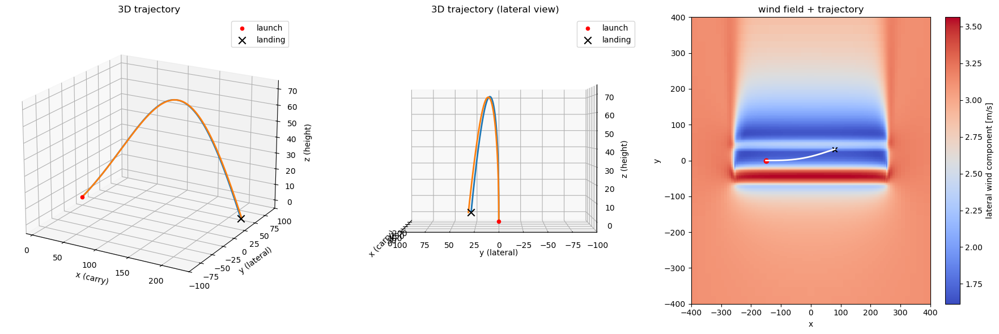

In [13]:
filepath = filepathwd90

U_ref = 6
dist = 150
corr_wf = WindField(profile='rans',ds=filepath, U_ref=U_ref)


# play field parameters - these make up the baseline shot
P0=np.array([-dist, 0, 0])
dt = 0.01       # time step

# Basis shot parameters - if not otherwise specified, these are used
shot_speed = 76.44384   # intital velocity
shot_angle = 25.4       # initial angle for trajectory	
shot_spin = 2545        # initial spin
spin_axis = 0           # spin axis adding impurity to the spin
orientation = 0        # play direction

# Basis wind parameters - if not otherwise specified, these are used
U_ref = 6      # reference wind speed at 10 meters above ground (6 m/s is approx. danish average)
z0 = 0.03       # surface roughness

log_wf = WindField(profile='log',U_ref=U_ref,z0=0.03,direction=90)
wind = corr_wf

traj = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=wind,
        orientation=orientation,
        P0=P0
    )
traj.solve(solver='euler', dt=dt)

traj_syn = Trajectory(
        ball_speed=shot_speed,
        launch_angle=shot_angle,
        spin_rate=shot_spin,
        spin_axis=spin_axis,
        wind=log_wf,
        orientation=orientation,
        P0=P0
    )
traj_syn.solve(solver='euler', dt=dt)

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# -------------------------------------------------
# Figure layout
# -------------------------------------------------
fig = plt.figure(figsize=(18, 6))

ax0 = fig.add_subplot(1, 3, 1, projection='3d')
ax1 = fig.add_subplot(1, 3, 2, projection='3d')
ax2 = fig.add_subplot(1, 3, 3)

shift = 150

# shifted trajectory
x = traj.p[:, 0] + shift
y = traj.p[:, 1]
z = traj.p[:, 2]

# shifted trajectory
xs = traj_syn.p[:, 0] + shift
ys = traj_syn.p[:, 1]
zs = traj_syn.p[:, 2]

# =================================================
# Left plot (3D isometric view)
# =================================================
ax0.plot(x, y, z, linewidth=2)
ax0.plot(xs, ys, zs, linewidth=2)

ax0.scatter(
    x[0], y[0], z[0],
    color='red',
    label='launch'
)

ax0.scatter(
    x[-1], y[-1], z[-1],
    color='black',
    marker='x',
    s=80,
    label='landing'
)


x_mid = 0.5 * (x.max() + x.min())

ax0.set_xlim(-10, x[-1]+10)
ax0.set_ylim(-100, 100)

ax1.set_xlim(-10, x[-1]+10)
ax1.set_ylim(-100, 100)


ax0.set_xlabel('x (carry)')
ax0.set_ylabel('y (lateral)')
ax0.set_zlabel('z (height)')
ax0.set_title('3D trajectory')

# nice oblique angle
ax0.view_init(elev=20, azim=-60)

ax0.legend()

# =================================================
# Middle plot (3D front view)
# =================================================
ax1.plot(x, y, z, linewidth=2)
ax1.plot(xs, ys, zs, linewidth=2)

ax1.scatter(
    x[0], y[0], z[0],
    color='red',
    label='launch'
)

ax1.scatter(
    x[-1], y[-1], z[-1],
    color='black',
    marker='x',
    s=80,
    label='landing'
)

ax1.set_xlabel('x (carry)')
ax1.set_ylabel('y (lateral)')
ax1.set_zlabel('z (height)')
ax1.set_title('3D trajectory (lateral view)')

# emphasize lateral movement
ax1.view_init(elev=1, azim=180)

ax1.legend()

# =================================================
# Right plot (top-down wind field)
# =================================================
U_slice = corr_wf.ds.V.isel(z=5)

U_slice.plot(
    x="x",
    y="y",
    ax=ax2,
    cmap="coolwarm",
    add_colorbar=True
)

ax2.plot(
    traj.p[:, 0],
    traj.p[:, 1],
    color='white',
    linewidth=2,
    label='trajectory'
)

ax2.scatter(
    traj.p[0, 0],
    traj.p[0, 1],
    color='red'
)

ax2.scatter(
    traj.p[-1, 0],
    traj.p[-1, 1],
    color='black',
    marker='x'
)

ax2.set_xlim(-400, 400)
ax2.set_ylim(-400, 400)

ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('wind field + trajectory')

plt.tight_layout()
plt.show()

# Trajectory parameter variations

In [27]:
def single_parameter_variation_shifter_demo_2(param_key, filekey="wd0"):

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    # =====================================================
    # GLOBAL FONT SETTINGS
    # =====================================================

    fs = 14
    legend_fs = 14

    plt.rcParams.update({
        "font.size": fs,
        "axes.titlesize": fs,
        "axes.labelsize": fs,
        "xtick.labelsize": fs,
        "ytick.labelsize": fs,
        "legend.fontsize": legend_fs
    })

    # SETTINGS
    x_shift = 150

    shift_param = "playershift"
    shift_values = parameter_library[shift_param]["values"]
    main_values = parameter_library[param_key]["values"]

    marker_list = ['o', 'v', 's', 'P', 'D', '^', '1', '+']
    shift_colors = plt.cm.coolwarm(np.linspace(0, 1, len(shift_values)))

    # =====================================================
    # FIGURE LAYOUT (FIXED LEGEND SPACE)
    # =====================================================

    fig = plt.figure(figsize=(12, 10))

    gs = fig.add_gridspec(
        3, 2,
        height_ratios=[1, 1, 0.55],   # ⬅️ increased legend space
        hspace=0.25,
        wspace=0.25
    )

    axes = np.empty((2, 2), dtype=object)

    axes[0, 0] = fig.add_subplot(gs[0, 0])
    axes[0, 1] = fig.add_subplot(gs[0, 1])
    axes[1, 0] = fig.add_subplot(gs[1, 0])
    axes[1, 1] = fig.add_subplot(gs[1, 1])

    # =====================================================
    # SPLIT LEGEND AREA INTO TWO ROWS (IMPORTANT FIX)
    # =====================================================

    leg_gs = gs[2, :].subgridspec(2, 1, height_ratios=[1, 1], hspace=0.15)

    ax_leg1 = fig.add_subplot(leg_gs[0, 0])  # parameter legend
    ax_leg2 = fig.add_subplot(leg_gs[1, 0])  # shift legend

    ax_leg1.axis("off")
    ax_leg2.axis("off")

    # STORAGE
    results = {}

    # =====================================================
    # SIMULATION LOOP
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        carry, height = [], []
        x_land, y_land = [], []

        color = shift_colors[i_shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=shift,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)
            plot_p = traj

            carry.append(plot_p[-1, 0] + x_shift)
            height.append(np.max(plot_p[:, 2]))

            x_land.append(plot_p[-1, 0] + x_shift)
            y_land.append(plot_p[-1, 1])

            axes[0, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 2],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.5,
                alpha=0.85
            )

            axes[1, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 1],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.2,
                alpha=0.8
            )

        results[shift] = (carry, height, x_land, y_land)

    # =====================================================
    # SCATTER PLOTS
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]
        carry, height, _, _ = results[shift]

        for i_param in range(len(main_values)):

            marker = marker_list[i_param % len(marker_list)]

            axes[0, 1].scatter(carry[i_param], height[i_param],
                               color=color, marker=marker, s=60)

            axes[1, 1].scatter(
                results[shift][2][i_param],
                results[shift][3][i_param],
                color=color, marker=marker, s=60
            )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()
    axes[1, 0].add_patch(c1)
    axes[1, 0].add_patch(c2)

    # =====================================================
    # FORMATTING
    # =====================================================

    for ax in axes.flat:
        ax.tick_params(labelsize=fs)

    axes[0, 0].set_title(f"{parameter_library[param_key]['name']} variation with player shift")
    axes[0, 0].set_ylabel("Height [m]")
    axes[0, 0].grid()

    axes[0, 1].set_title("Carry vs Max Height")
    axes[0, 1].set_ylabel("Max Height [m]")
    axes[0, 1].grid()

    axes[1, 0].set_title("Top View")
    axes[1, 0].set_xlabel("x [m]")
    axes[1, 0].set_ylabel("y [m]")
    axes[1, 0].set_ylim(-75, 75)
    axes[1, 0].grid()

    axes[1, 1].set_title("Landing Positions")
    axes[1, 1].set_xlabel("x [m]")
    axes[1, 1].set_ylabel("y [m]")
    axes[1, 1].grid()

    # =====================================================
    # LEGEND 1: PARAMETER (GRAY SHAPES)
    # =====================================================

    param_handles = [
        Line2D(
            [0], [0],
            marker=marker_list[i % len(marker_list)],
            linestyle="None",
            markerfacecolor="lightgray",
            markeredgecolor="black",
            markersize=8,
            label=f"{format_param(v)}"
        )
        for i, v in enumerate(main_values)
    ]

    ax_leg1.legend(
        handles=param_handles,
        title=f"{parameter_library[param_key]['name']}",
        loc="center",
        ncol=5,
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=legend_fs
    )

    # =====================================================
    # LEGEND 2: SHIFT (OUTLINED COLORED SQUARES)
    # =====================================================

    shift_handles = [
        Patch(
            facecolor="none",
            edgecolor=shift_colors[i],
            linewidth=2,
            label=f"shift = {format_param(s)} m"
        )
        for i, s in enumerate(shift_values)
    ]

    ax_leg2.legend(
        handles=shift_handles,
        title="Player Shift",
        loc="center",
        ncol=min(len(shift_values), 5),
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=legend_fs
    )

    # =====================================================
    # FINAL LAYOUT (IMPORTANT)
    # =====================================================

    fig.subplots_adjust(
        left=0.06,
        right=0.98,
        top=0.95,
        bottom=0.06
    )

    plt.show()

In [9]:
def single_parameter_variation_shifter_difference(param_key, filekey="wd0"):

    # =====================================================
    # SETTINGS
    # =====================================================

    x_shift = 150

    shift_param = "playershift"
    shift_values = parameter_library[shift_param]["values"]

    main_values = parameter_library[param_key]["values"]

    # marker map for varying parameter
    marker_list = ['o', 'v', 's', 'P', 'D', '^', '1', '+']

    # colors represent shift
    shift_colors = plt.cm.coolwarm(
        np.linspace(0, 1, len(shift_values))
    )

    # =====================================================
    # FIGURE LAYOUT
    # =====================================================

    fig = plt.figure(figsize=(18, 10))

    gs = fig.add_gridspec(
        2, 3,
        width_ratios=[1, 1, 0.32],
        wspace=0.25
    )

    axes = np.empty((2,2), dtype=object)

    axes[0,0] = fig.add_subplot(gs[0,0])
    axes[0,1] = fig.add_subplot(gs[0,1])

    axes[1,0] = fig.add_subplot(gs[1,0])
    axes[1,1] = fig.add_subplot(gs[1,1])

    # legend axis
    ax_leg = fig.add_subplot(gs[:,2])
    ax_leg.axis("off")

    # =====================================================
    # STORAGE
    # =====================================================

    results = {}

    # =====================================================
    # MAIN LOOP
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        carry_ref, height_ref = [], []
        x_land_ref, y_land_ref = [], []
        carry, height = [], []
        x_land, y_land = [], []

        color = shift_colors[i_shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=shift,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)

            plot_p = traj
            
            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=0,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj_ref = run_simulation(**kwargs)

            plot_p_ref = traj_ref

            # =============================================
            # METRICS
            # =============================================

            carry.append(plot_p[-1,0] - plot_p_ref[-1,0])

            height.append(np.max(plot_p[:,2]) - np.max(plot_p_ref[:,2]))

            x_land.append(plot_p[-1,0] - plot_p_ref[-1,0])

            y_land.append(plot_p[-1,1] - plot_p_ref[-1,1] - shift)

            # =============================================
            # SIDE VIEW
            # =============================================

            axes[0,0].plot(
                plot_p[:,0] + x_shift,
                plot_p[:,2],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.5,
                alpha=0.85
            )

            # =============================================
            # TOP VIEW
            # =============================================

            axes[1,0].plot(
                plot_p[:,0] + x_shift,
                plot_p[:,1],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.2,
                alpha=0.8
            )

        results[shift] = (
            carry,
            height,
            x_land,
            y_land
        )

    # =====================================================
    # CARRY VS HEIGHT
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]

        carry, height, _, _ = results[shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            axes[0,1].scatter(
                carry[i_param],
                height[i_param],
                color=color,
                marker=marker,
                s=60
            )

    # =====================================================
    # LANDING
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]

        _, _, x_land, y_land = results[shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            axes[1,1].scatter(
                x_land[i_param],
                y_land[i_param],
                color=color,
                marker=marker,
                s=60
            )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()

    axes[1,0].add_patch(c1)
    axes[1,0].add_patch(c2)

    # =====================================================
    # FORMATTING
    # =====================================================

    axes[0,0].set_title(
        f"{param_key} variation with player shift"
    )

    axes[0,0].set_xlabel("Carry (m)")
    axes[0,0].set_ylabel("Height (m)")
    axes[0,0].grid()

    axes[0,1].set_title("Carry vs Max Height relative to shift y=0m")
    axes[0,1].set_xlabel("Carry difference (m)")
    axes[0,1].set_ylabel("Max Height difference (m)")
    axes[0,1].grid()

    axes[1,0].set_title("Top View")
    axes[1,0].set_xlabel("x (m)")
    axes[1,0].set_ylabel("y (m)")
    axes[1,0].set_ylim(-75, 75)
    axes[1,0].grid()

    axes[1,1].set_title("Landing Position difference relative to shift y=0m")
    axes[1,1].set_xlabel("x difference (m)")
    axes[1,1].set_ylabel("y difference (m)")
    axes[1,1].grid()

    # =====================================================
    # LEGEND HANDLES
    # =====================================================

    # ---------------------------------------------
    # COLOR LEGEND = SHIFT
    # ---------------------------------------------

    shift_handles = []

    for i_shift, shift in enumerate(shift_values):

        shift_handles.append(
            Line2D(
                [0], [0],
                color=shift_colors[i_shift],
                lw=3,
                label=f"shift = {format_param(shift)}"
            )
        )

    # ---------------------------------------------
    # MARKER LEGEND = PARAMETER
    # ---------------------------------------------

    param_handles = []

    for i_param, v in enumerate(main_values):

        param_handles.append(
            Line2D(
                [0], [0],
                color='black',
                marker=marker_list[i_param % len(marker_list)],
                linestyle='None',
                markersize=8,
                label=f"{format_param(v)}"
            )
        )

    # =====================================================
    # DRAW LEGENDS IN SEPARATE AXIS
    # =====================================================

    legend1 = ax_leg.legend(
        handles=shift_handles,
        title="Player Shift\n(color)",
        loc='upper left',
        frameon=True
    )

    ax_leg.add_artist(legend1)

    legend2 = ax_leg.legend(
        handles=param_handles,
        title=f"{param_key}\n(marker)",
        loc='lower left',
        frameon=True
    )

    # =====================================================
    # FINALIZE
    # =====================================================
    
    plt.show()

In [105]:
def single_parameter_variation_combo_csv(param_key):
    
    filekeys = ["wd0", "wd45", "wd90"]
    markers = {"wd0": "o", "wd45": "X", "wd90": "s"}

    p = parameter_library[param_key]
    values = p["values"]

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    cmap = plt.cm.coolwarm
    norm = plt.Normalize(min(values), max(values))

    # =====================================================
    # STORAGE (for plots)
    # =====================================================
    carry_all = {fk: [] for fk in filekeys}
    height_all = {fk: [] for fk in filekeys}
    x_land_all = {fk: [] for fk in filekeys}
    y_land_all = {fk: [] for fk in filekeys}

    traj_cache = {}

    # =====================================================
    # CSV STORAGE
    # =====================================================
    results = []

    # =====================================================
    # RUN SIMULATIONS
    # =====================================================
    for fk in filekeys:
        for v in values:

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=p_shift,
                profile="rans",
                filekey=fk
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)

            direction_used = v if param_key == "direction" else direction

            plot_p = transform_to_local_frame(
                traj,
                direction_used,
                kwargs["playershift"]
            )

            color = cmap(norm(v))

            traj_cache[(fk, v)] = plot_p

            # -------------------------------------------------
            # metrics
            # -------------------------------------------------
            carry_val = plot_p[-1, 0]
            max_h = np.max(plot_p[:, 2])
            land_x = plot_p[-1, 0]
            land_y = plot_p[-1, 1]

            carry_all[fk].append(carry_val)
            height_all[fk].append(max_h)
            x_land_all[fk].append(land_x)
            y_land_all[fk].append(land_y)

            # -------------------------------------------------
            # CSV row
            # -------------------------------------------------
            results.append({
                "filekey": fk,
                param_key: v,
                "carry_m": carry_val,
                "max_height_m": max_h,
                "landing_x_m": land_x,
                "landing_y_m": land_y
            })

            # =================================================
            # SIDE VIEW
            # =================================================
            axes[0,0].plot(
                plot_p[:,0], plot_p[:,2],
                color=color,
                marker=markers[fk],
                markevery=25,
                linewidth=1.5,
                label=f"{param_key} = {format_param(v)}" if fk == "wd0" else None
            )

            # =================================================
            # TOP VIEW
            # =================================================
            axes[1,0].plot(
                plot_p[:,0], plot_p[:,1],
                color=color,
                marker=markers[fk],
                markevery=25,
                linewidth=1.2
            )

    # =====================================================
    # PLOTS (UNCHANGED)
    # =====================================================

    axes[0,0].set_title("Side view (color=parameter, marker=file)")
    axes[0,0].set_xlabel("Carry (m)")
    axes[0,0].set_ylabel("Height (m)")
    axes[0,0].grid()
    axes[0,0].legend(title=param_key)

    for fk in filekeys:
        for i, v in enumerate(values):
            axes[0,1].scatter(
                carry_all[fk][i],
                height_all[fk][i],
                color=cmap(norm(v)),
                marker=markers[fk],
                linewidths=0.8
            )

    axes[0,1].set_title("Carry vs Max height")
    axes[0,1].set_xlabel("Carry (m)")
    axes[0,1].set_ylabel("Height (m)")
    axes[0,1].grid()

    color_handles = []

    for v in values:

        color_handles.append(
            Line2D(
                [0], [0],
                marker='s',
                linestyle='None',
                markerfacecolor=cmap(norm(v)),
                markeredgecolor='black',
                markersize=10,
                label=f"{format_param(v)}"
            )
        )

    axes[0,1].legend(
        handles=color_handles,
        title=p["name"],
        fontsize=10
    )

    c1, c2 = make_corridors()
    axes[1,0].add_patch(c1)
    axes[1,0].add_patch(c2)

    axes[1,0].set_title("Top view")
    axes[1,0].set_xlabel("x (m)")
    axes[1,0].set_ylabel("y (m)")
    axes[1,0].grid()

    for fk in filekeys:
        for i, v in enumerate(values):
            axes[1,1].scatter(
                x_land_all[fk][i],
                y_land_all[fk][i],
                color=cmap(norm(v)),
                marker=markers[fk],
                linewidths=0.8
            )

    axes[1,1].set_title("Landing positions")
    axes[1,1].set_xlabel("x (m)")
    axes[1,1].set_ylabel("y (m)")
    axes[1,1].grid()

    for fk in filekeys:
        axes[1,1].scatter([], [], marker=markers[fk], label=fk, color='gray')
    axes[1,1].legend(title="wind file")

    plt.tight_layout()
    plt.show()

    # =====================================================
    # SAVE CSV
    # =====================================================
    df = pd.DataFrame(results)

    filename = f"single_param_combo_{param_key}.csv"
    df.to_csv(filename, index=False)

    print(f"Saved CSV → {filename}")

    return df

In [124]:
def single_parameter_variation_combo(param_key):

    filekeys = ["wd0", "wd45", "wd90"]
    markers = {"wd0": "o", "wd45": "X", "wd90": "s"}

    p = parameter_library[param_key]
    values = p["values"]

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    cmap = plt.cm.coolwarm
    norm = plt.Normalize(min(values), max(values))

    # =====================================================
    # STORAGE
    # =====================================================

    carry_all = {fk: [] for fk in filekeys}
    height_all = {fk: [] for fk in filekeys}
    x_land_all = {fk: [] for fk in filekeys}
    y_land_all = {fk: [] for fk in filekeys}

    traj_cache = {}

    # =====================================================
    # CSV STORAGE
    # =====================================================

    results = []

    # =====================================================
    # RUN SIMULATIONS
    # =====================================================

    for fk in filekeys:

        for v in values:

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=p_shift,
                profile="rans",
                filekey=fk
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)

            direction_used = v if param_key == "direction" else direction

            plot_p = transform_to_local_frame(
                traj,
                direction_used,
                kwargs["playershift"]
            )

            color = cmap(norm(v))

            traj_cache[(fk, v)] = plot_p

            # -------------------------------------------------
            # Metrics
            # -------------------------------------------------

            carry_val = plot_p[-1, 0]
            max_h = np.max(plot_p[:, 2])
            land_x = plot_p[-1, 0]
            land_y = plot_p[-1, 1]

            carry_all[fk].append(carry_val)
            height_all[fk].append(max_h)
            x_land_all[fk].append(land_x)
            y_land_all[fk].append(land_y)

            # -------------------------------------------------
            # CSV row
            # -------------------------------------------------

            results.append({
                "filekey": fk,
                param_key: v,
                "carry_m": carry_val,
                "max_height_m": max_h,
                "landing_x_m": land_x,
                "landing_y_m": land_y
            })

            # =================================================
            # SIDE VIEW
            # =================================================

            axes[0, 0].plot(
                plot_p[:, 0],
                plot_p[:, 2],
                color=color,
                marker=markers[fk],
                markevery=25,
                linewidth=1.5
            )

            # =================================================
            # TOP VIEW
            # =================================================

            axes[1, 0].plot(
                plot_p[:, 0],
                plot_p[:, 1],
                color=color,
                marker=markers[fk],
                markevery=25,
                linewidth=1.2
            )

    # =====================================================
    # SIDE VIEW
    # =====================================================

    axes[0, 0].set_title("Trajectory side view")
    axes[0, 0].set_xlabel("Carry [m]")
    axes[0, 0].set_ylabel("Height [m]")
    axes[0, 0].grid()

    # =====================================================
    # CARRY vs HEIGHT
    # =====================================================

    for fk in filekeys:

        for i, v in enumerate(values):

            axes[0, 1].scatter(
                carry_all[fk][i],
                height_all[fk][i],
                color=cmap(norm(v)),
                marker=markers[fk],
                linewidths=0.8
            )

    axes[0, 1].set_title("Carry vs Max height")
    axes[0, 1].set_xlabel("Carry [m]]")
    axes[0, 1].set_ylabel("Height [m]")
    axes[0, 1].grid()

    # =====================================================
    # COLOR LEGEND -> [0,1]
    # =====================================================

    color_handles = []

    for v in values:

        color_handles.append(
            Line2D(
                [0], [0],
                linestyle='solid',
                color=cmap(norm(v)),
                linewidth=2,
                markersize=10,
                label=f"{format_param(v)}"
            )
        )

    axes[0, 1].legend(
        handles=color_handles,
        title=p["name"],
        fontsize=10
    )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()

    axes[1, 0].add_patch(c1)
    axes[1, 0].add_patch(c2)

    axes[1, 0].set_title("Top view")
    axes[1, 0].set_xlabel("x [m]")
    axes[1, 0].set_ylabel("y [m]")
    axes[1, 0].grid()

    # =====================================================
    # LANDING POSITIONS
    # =====================================================

    for fk in filekeys:

        for i, v in enumerate(values):

            axes[1, 1].scatter(
                x_land_all[fk][i],
                y_land_all[fk][i],
                color=cmap(norm(v)),
                marker=markers[fk],
                linewidths=0.8
            )

    axes[1, 1].set_title("Landing positions")
    axes[1, 1].set_xlabel("x [m]")
    axes[1, 1].set_ylabel("y [m]")
    axes[1, 1].grid()

    # =====================================================
    # MARKER LEGEND -> [0,0]
    # =====================================================

    marker_handles = []

    for fk in filekeys:

        marker_handles.append(
            Line2D(
                [0], [0],
                marker=markers[fk],
                linestyle='None',
                markerfacecolor='gray',
                markeredgecolor='black',
                color='gray',
                markersize=10,
                label=fk
            )
        )

    axes[0, 0].legend(
        handles=marker_handles,
        title="Wind file",
        fontsize=10
    )

    # =====================================================
    # FINALIZE
    # =====================================================

    plt.tight_layout()
    plt.show()

In [129]:
def single_parameter_variation_shifter(param_key, filekey="wd0"):

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # =====================================================
    # GLOBAL FONT SETTINGS
    # =====================================================

    fs = 14
    legend_fs = 12

    plt.rcParams.update({
        "font.size": fs,
        "axes.titlesize": fs,
        "axes.labelsize": fs,
        "xtick.labelsize": fs,
        "ytick.labelsize": fs,
    })

    # SETTINGS
    x_shift = 150

    shift_param = "playershift"
    shift_values = parameter_library[shift_param]["values"]
    main_values = parameter_library[param_key]["values"]

    marker_list = ['o', 'v', 's', 'P', 'D', '^', '1', '+']
    shift_colors = plt.cm.coolwarm(np.linspace(0, 1, len(shift_values)))

    # =====================================================
    # FIGURE LAYOUT (FIXED LEGEND SPACE)
    # =====================================================

    fig = plt.figure(figsize=(12, 10))

    gs = fig.add_gridspec(
        3, 2,
        height_ratios=[1, 1, 0.75],   # ⬅️ MORE SPACE FOR LEGENDS
        hspace=0.25,
        wspace=0.25
    )

    axes = np.empty((2, 2), dtype=object)

    axes[0, 0] = fig.add_subplot(gs[0, 0])
    axes[0, 1] = fig.add_subplot(gs[0, 1])
    axes[1, 0] = fig.add_subplot(gs[1, 0])
    axes[1, 1] = fig.add_subplot(gs[1, 1])

    # =====================================================
    # SPLIT LEGEND AREA INTO TWO REAL AXES (NO OVERLAP)
    # =====================================================

    leg_gs = gs[2, :].subgridspec(2, 1, hspace=0.6)

    ax_leg1 = fig.add_subplot(leg_gs[0, 0])
    ax_leg2 = fig.add_subplot(leg_gs[1, 0])

    ax_leg1.axis("off")
    ax_leg2.axis("off")

    # STORAGE
    results = {}

    # =====================================================
    # SIMULATION LOOP
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        carry, height = [], []
        x_land, y_land = [], []

        color = shift_colors[i_shift]

        for i_param, v in enumerate(main_values):

            marker = marker_list[i_param % len(marker_list)]

            kwargs = dict(
                shot_speed=shot_speed,
                shot_angle=shot_angle,
                shot_spin=shot_spin,
                U_ref=U_ref,
                z0=z0,
                direction=direction,
                playershift=shift,
                profile="rans",
                filekey=filekey
            )

            kwargs[param_key] = v

            traj = run_simulation(**kwargs)
            plot_p = traj

            carry.append(plot_p[-1, 0] + x_shift)
            height.append(np.max(plot_p[:, 2]))

            x_land.append(plot_p[-1, 0] + x_shift)
            y_land.append(plot_p[-1, 1])

            axes[0, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 2],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.5,
                alpha=0.85
            )

            axes[1, 0].plot(
                plot_p[:, 0] + x_shift,
                plot_p[:, 1],
                color=color,
                marker=marker,
                markevery=25,
                linewidth=1.2,
                alpha=0.8
            )

        results[shift] = (carry, height, x_land, y_land)

    # =====================================================
    # SCATTER PLOTS
    # =====================================================

    for i_shift, shift in enumerate(shift_values):

        color = shift_colors[i_shift]
        carry, height, _, _ = results[shift]

        for i_param in range(len(main_values)):

            marker = marker_list[i_param % len(marker_list)]

            axes[0, 1].scatter(carry[i_param], height[i_param],
                               color=color, marker=marker, s=60)

            axes[1, 1].scatter(
                results[shift][2][i_param],
                results[shift][3][i_param],
                color=color, marker=marker, s=60
            )

    # =====================================================
    # CORRIDORS
    # =====================================================

    c1, c2 = make_corridors()
    axes[1, 0].add_patch(c1)
    axes[1, 0].add_patch(c2)

    # =====================================================
    # FORMATTING
    # =====================================================

    for ax in axes.flat:
        ax.tick_params(labelsize=fs)

    axes[0, 0].set_title(f"{parameter_library[param_key]['name']} variation with player shift")
    axes[0, 0].set_ylabel("Height [m]")
    axes[0, 0].grid()

    axes[0, 1].set_title("Carry vs Max Height")
    axes[0, 1].set_ylabel("Max Height [m]")
    axes[0, 1].grid()

    axes[1, 0].set_title("Top View")
    axes[1, 0].set_xlabel("x [m]")
    axes[1, 0].set_ylabel("y [m]")
    axes[1, 0].set_ylim(-75, 75)
    axes[1, 0].grid()

    axes[1, 1].set_title("Landing Positions")
    axes[1, 1].set_xlabel("x [m]")
    axes[1, 1].set_ylabel("y [m]")
    axes[1, 1].grid()

    # =====================================================
    # LEGEND 1: PARAMETER (LARGE GREY MARKERS)
    # =====================================================

    param_handles = [
        Line2D(
            [0], [0],
            marker=marker_list[i % len(marker_list)],
            linestyle="None",
            markerfacecolor="lightgray",
            markeredgecolor="black",
            markeredgewidth=1.2,
            markersize=12,   # ⬅️ BIGGER
            label=f"{format_param(v)}"
        )
        for i, v in enumerate(main_values)
    ]

    ax_leg1.legend(
        handles=param_handles,
        title=f"{parameter_library[param_key]['name']}",
        loc="center",
        ncol=10,
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=legend_fs
    )

    # =====================================================
    # LEGEND 2: SHIFT (LARGE COLORED SQUARES, BLACK BORDER)
    # =====================================================

    shift_handles = [
        Line2D(
            [0], [0],
            marker='s',
            linestyle="None",
            markerfacecolor=shift_colors[i],
            markeredgecolor="black",
            markeredgewidth=1.2,
            markersize=12,   # ⬅️ BIGGER
            label=f"shift = {format_param(s)} m"
        )
        for i, s in enumerate(shift_values)
    ]

    ax_leg2.legend(
        handles=shift_handles,
        title="Player Shift [m]",
        loc="center",
        ncol=min(len(shift_values), 5),
        frameon=False,
        fontsize=legend_fs,
        title_fontsize=legend_fs
    )

    # =====================================================
    # FINAL LAYOUT TUNING
    # =====================================================

    fig.subplots_adjust(
        left=0.06,
        right=0.98,
        top=0.95,
        bottom=0.06
    )

    plt.show()

### Single parameter variations at $\psi=0$

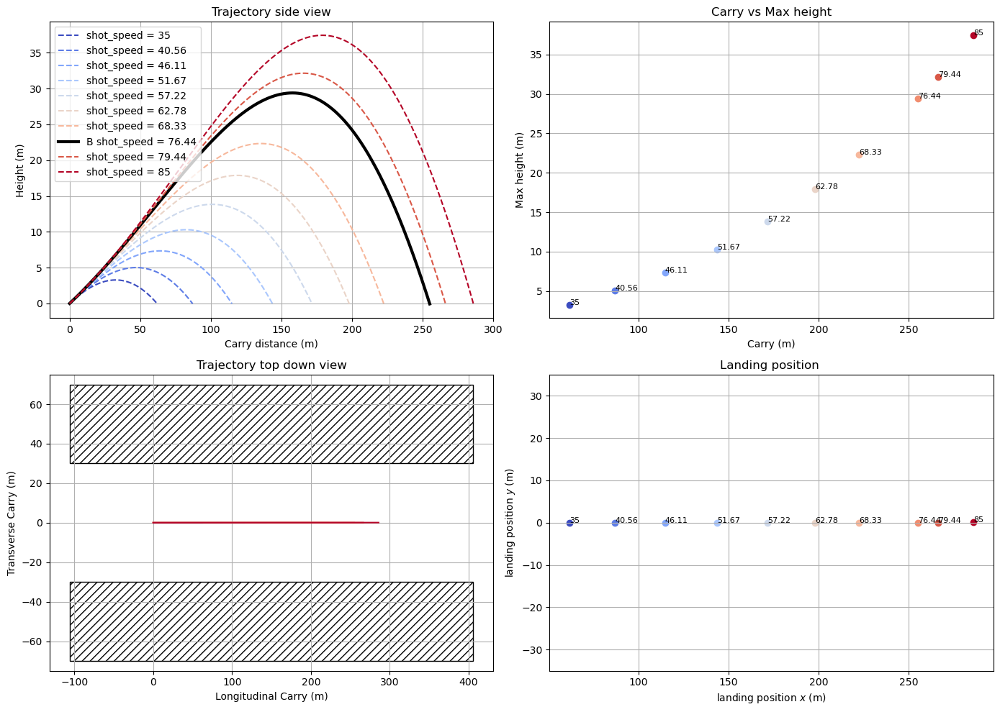

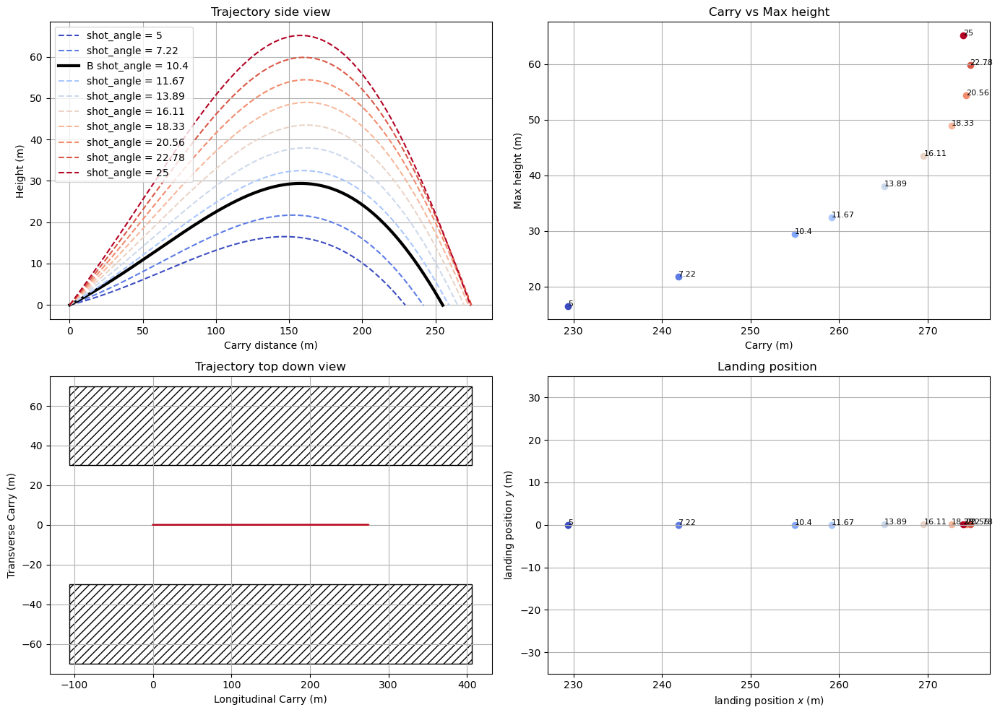

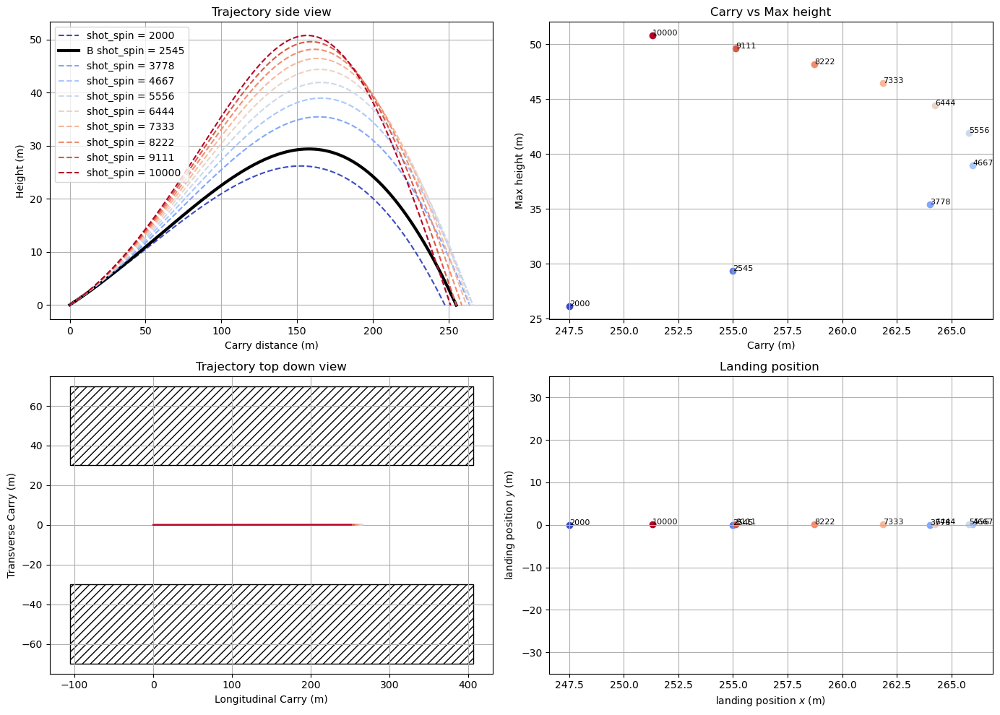

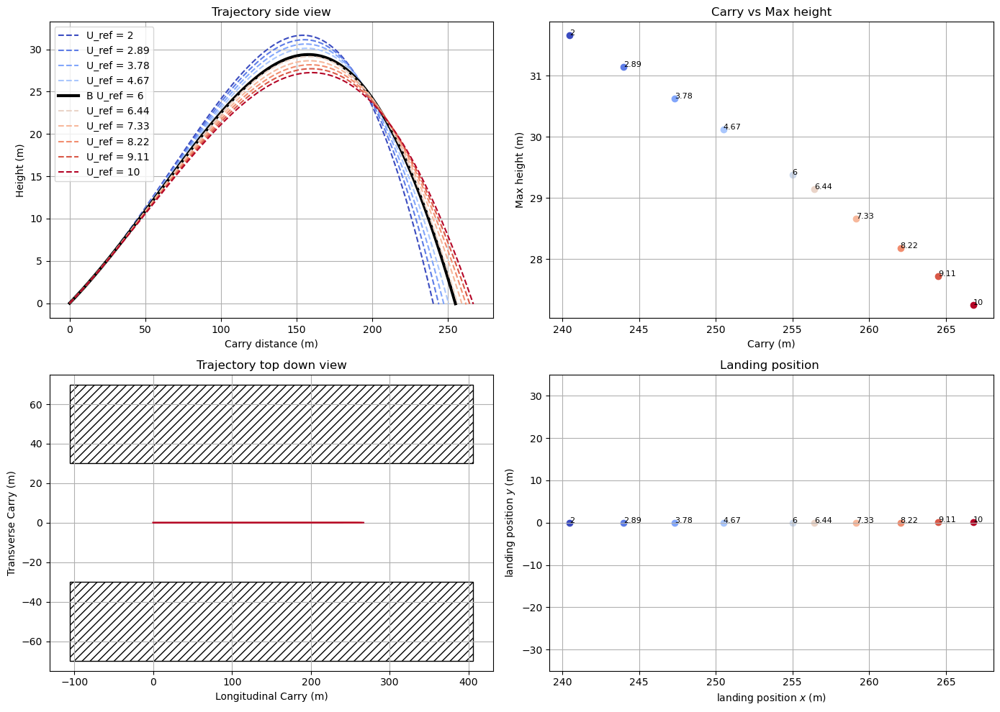

In [21]:
# run w. wd0
single_parameter_variation("shot_speed", filekey="wd0")
single_parameter_variation("shot_angle", filekey="wd0")
single_parameter_variation("shot_spin", filekey="wd0")
single_parameter_variation("U_ref", filekey="wd0")
#single_parameter_variation("direction", filekey="wd0")
#single_parameter_variation("playershift", filekey="wd0") 

### Single parameter variations at $\psi=45$

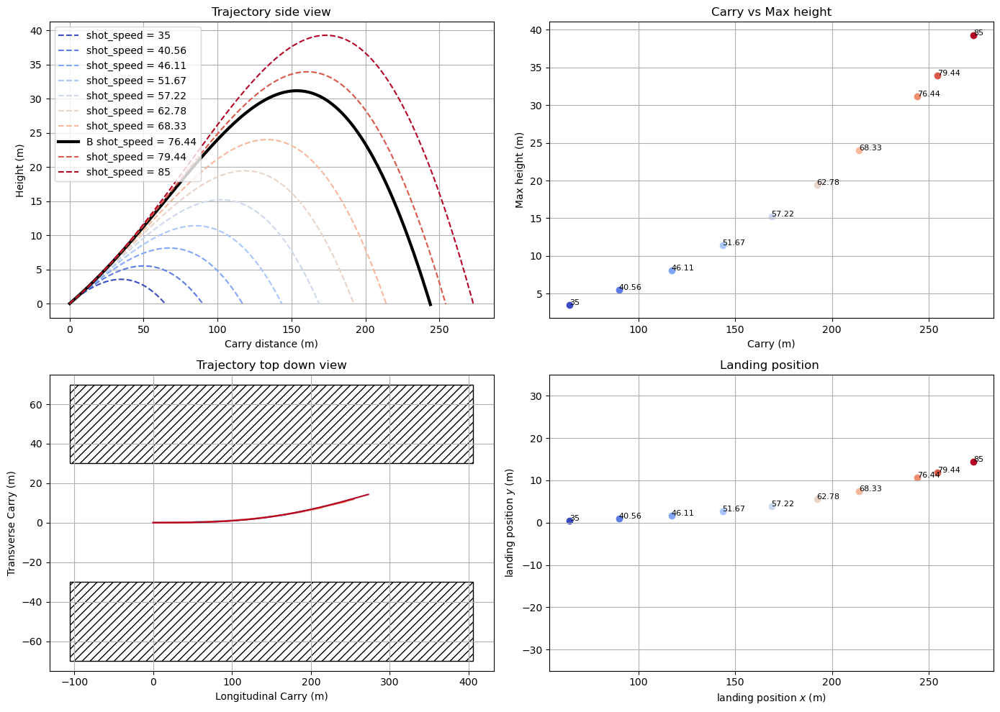

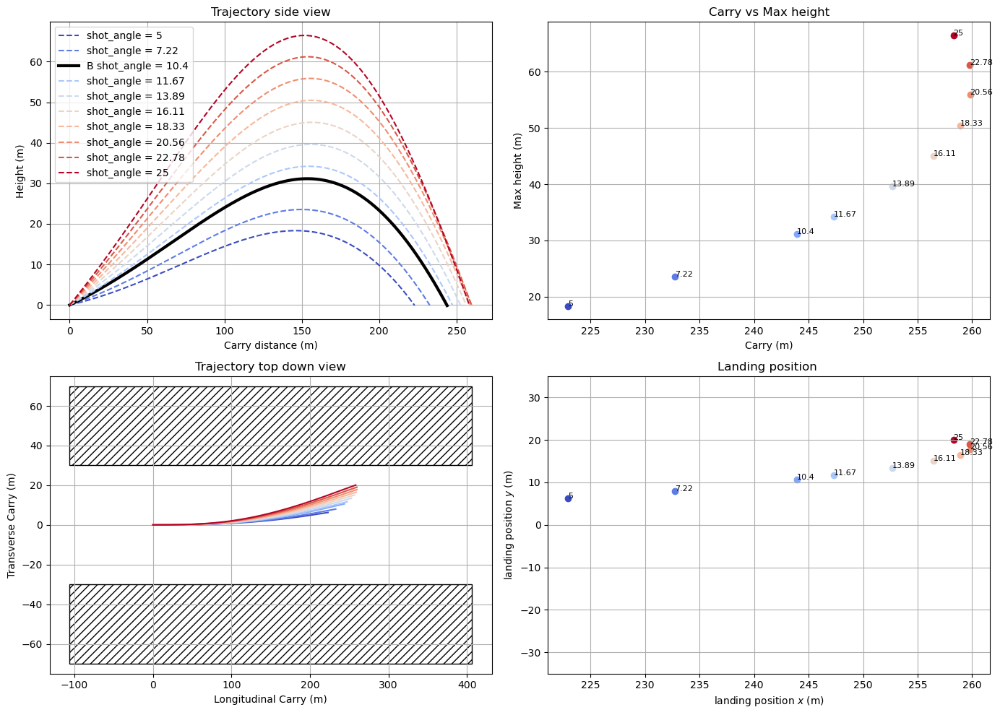

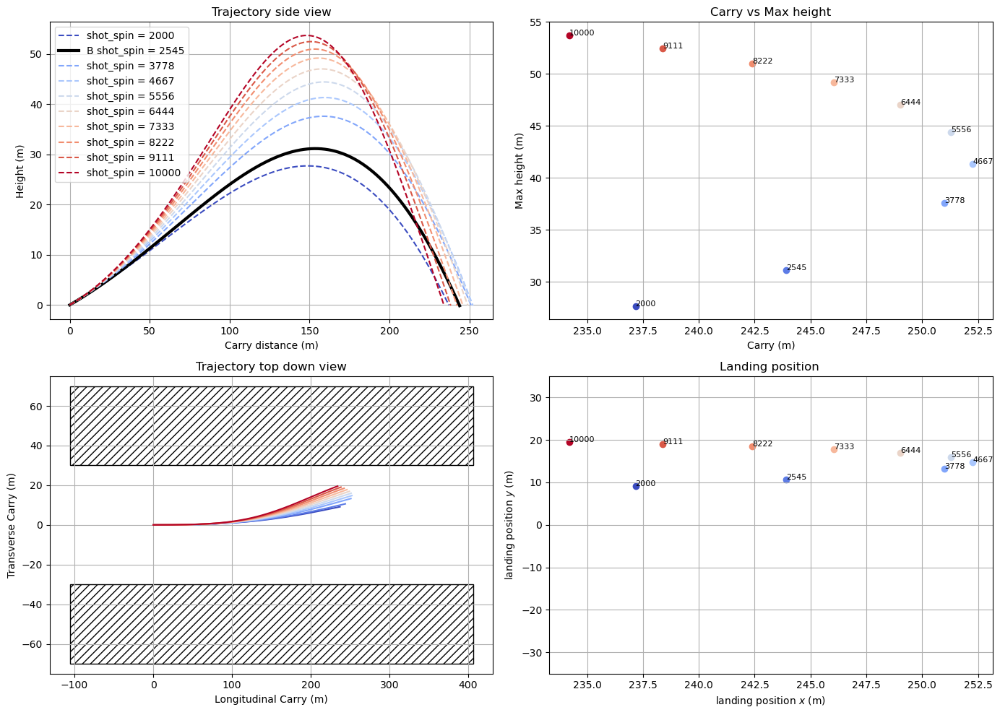

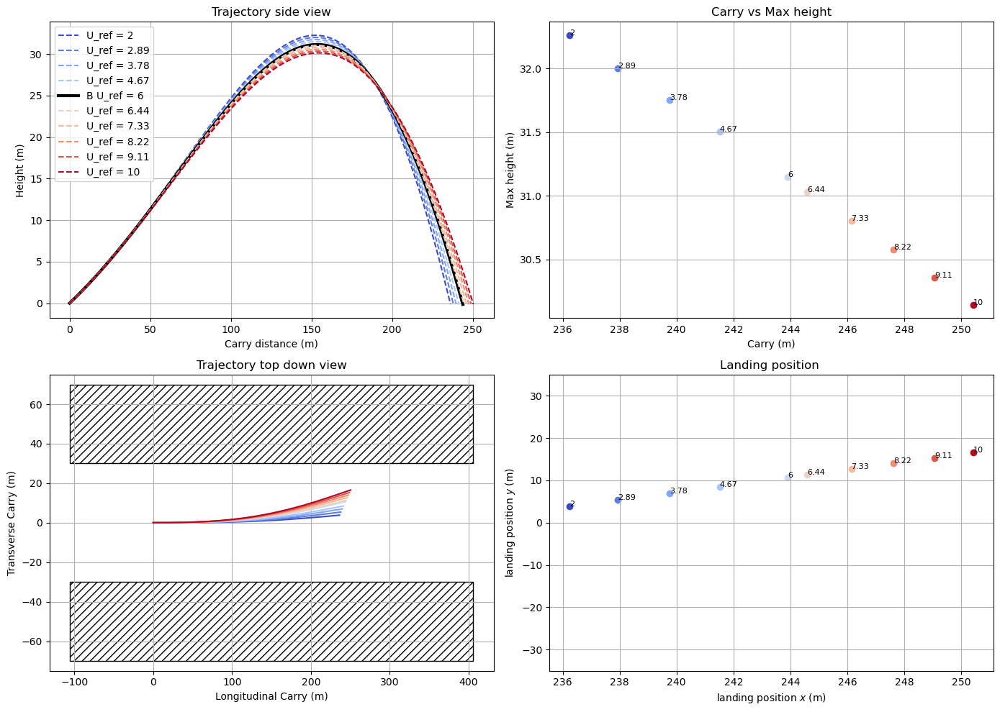

In [22]:
# run w. wd45
single_parameter_variation("shot_speed", filekey="wd45")
single_parameter_variation("shot_angle", filekey="wd45")
single_parameter_variation("shot_spin", filekey="wd45")
single_parameter_variation("U_ref", filekey="wd45")
#single_parameter_variation("direction", filekey="wd45")
#single_parameter_variation("playershift", filekey="wd45") 

### Single parameter variations at $\psi=90$

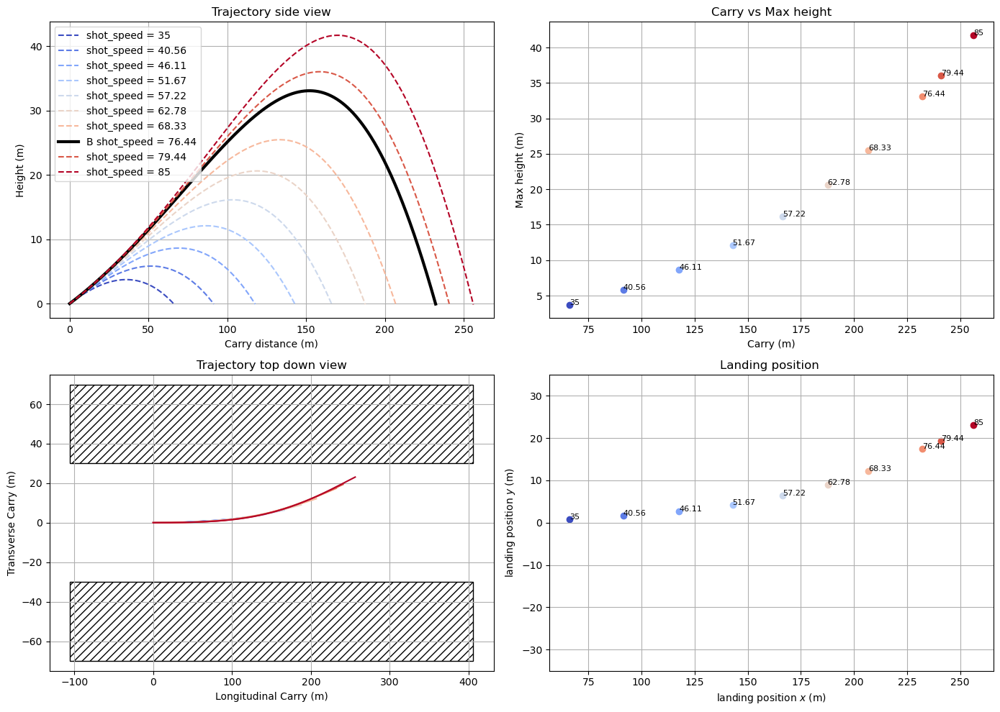

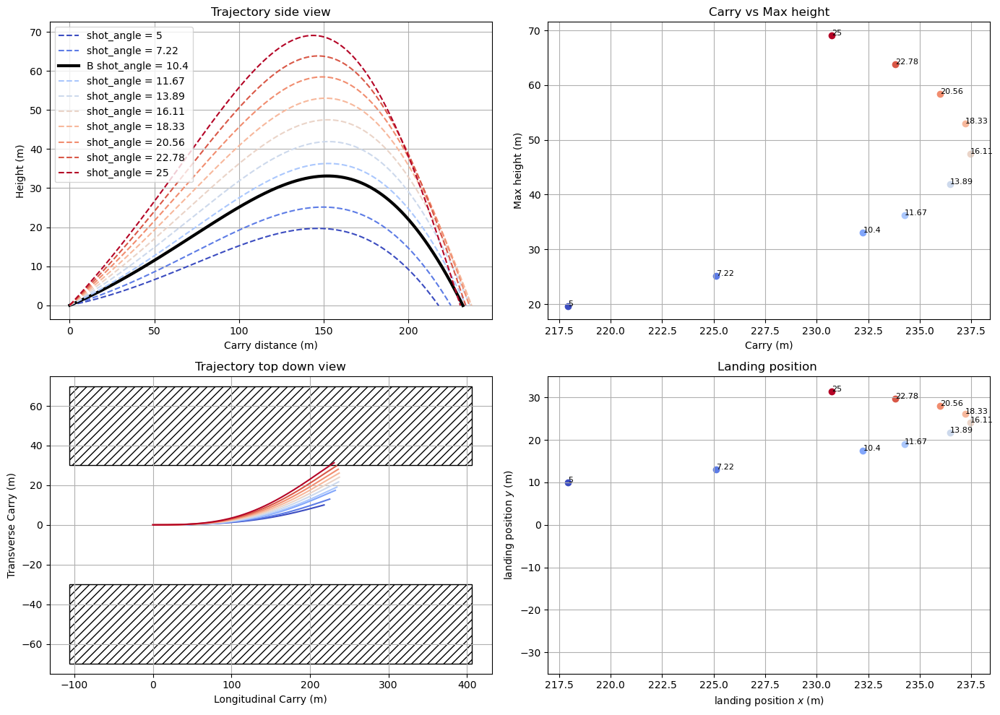

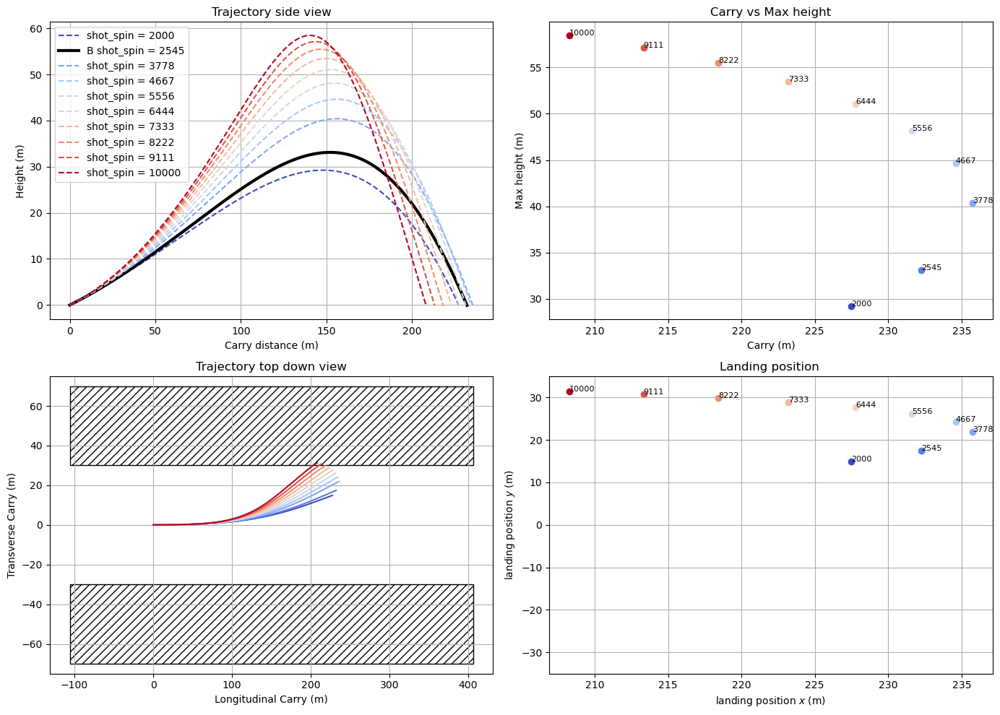

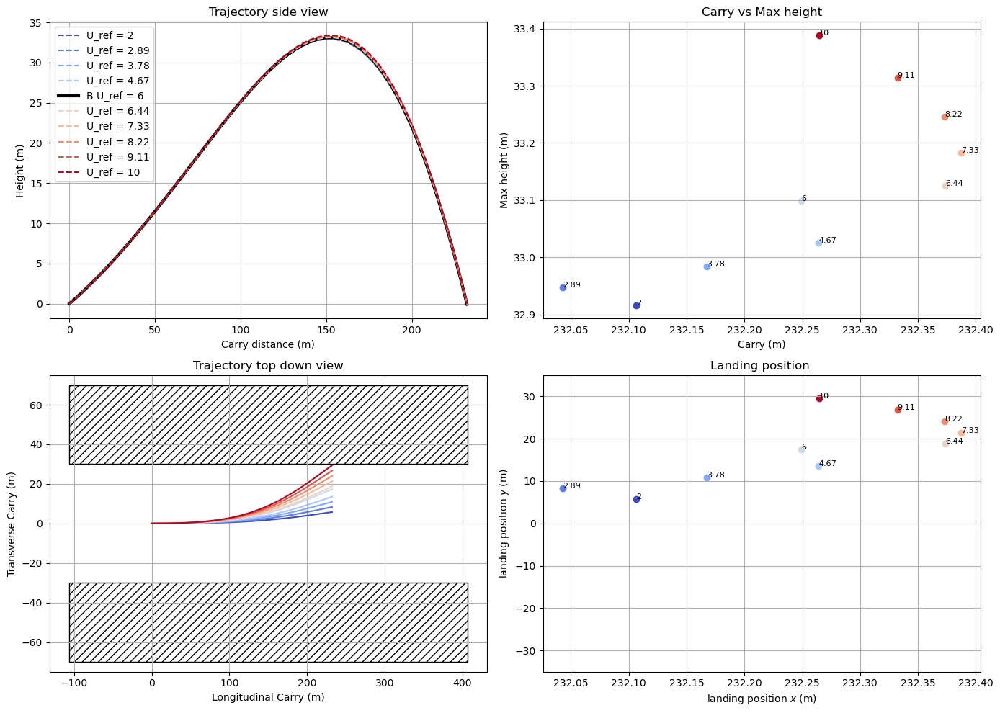

In [23]:
# run w. wd90
single_parameter_variation("shot_speed", filekey="wd90")
single_parameter_variation("shot_angle", filekey="wd90")
single_parameter_variation("shot_spin", filekey="wd90")
single_parameter_variation("U_ref", filekey="wd90")
#single_parameter_variation("direction", filekey="wd90")
#single_parameter_variation("playershift", filekey="wd90") 

## Single parameter variation across $\psi$-range

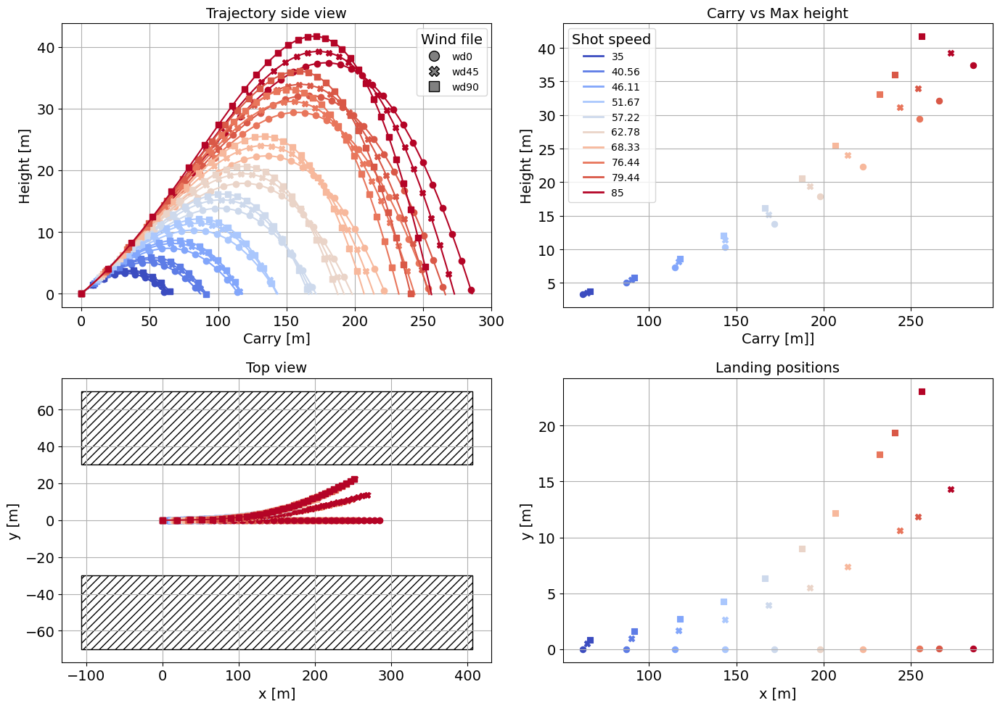

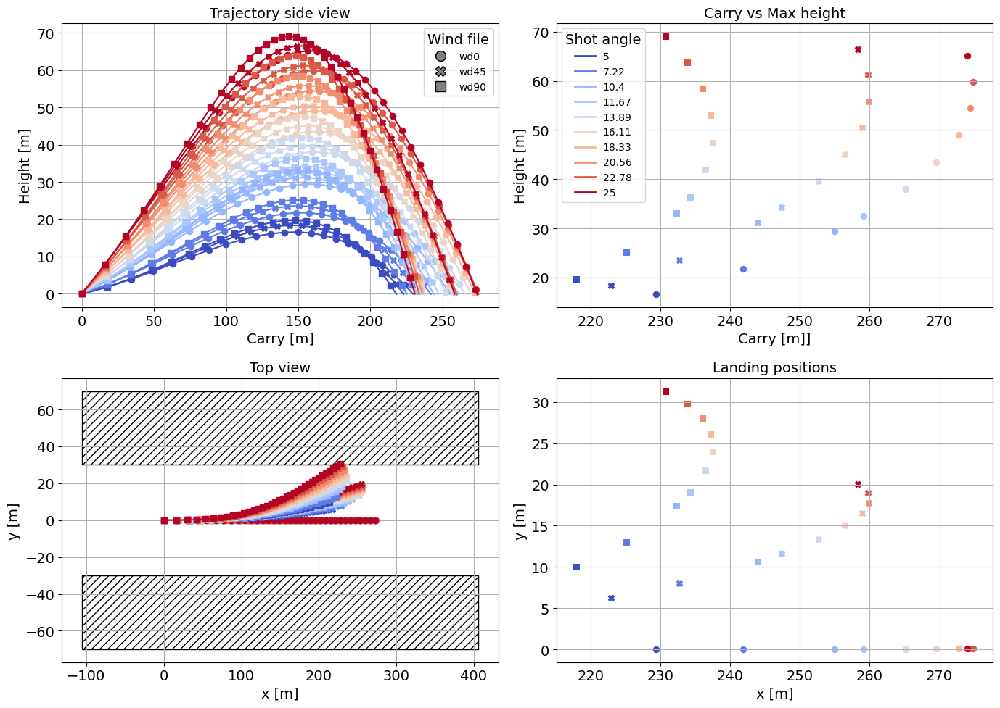

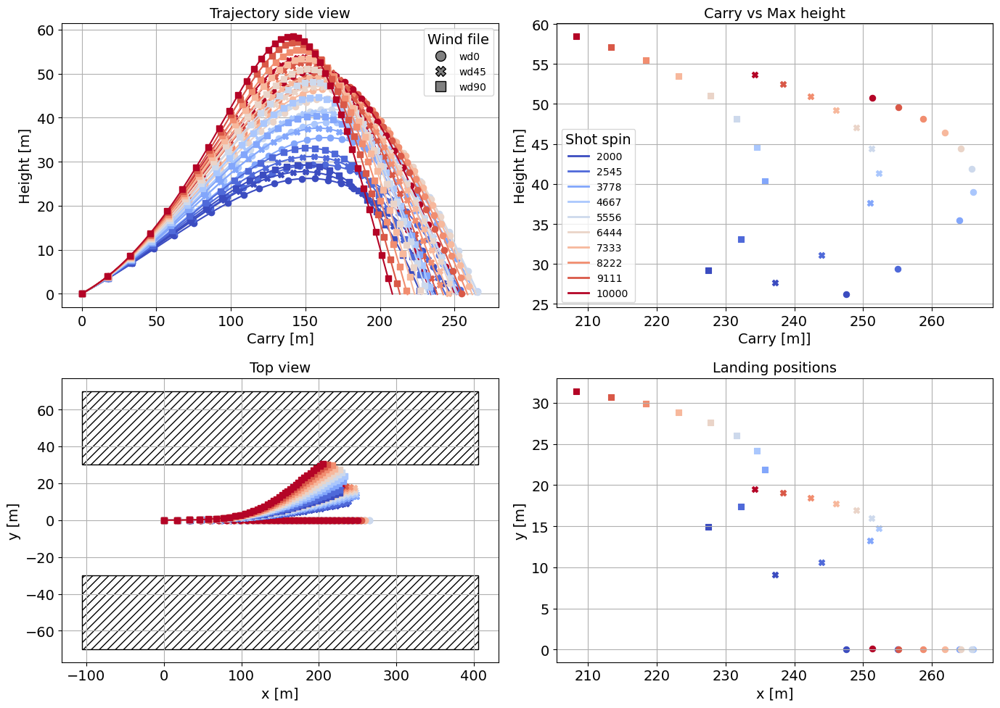

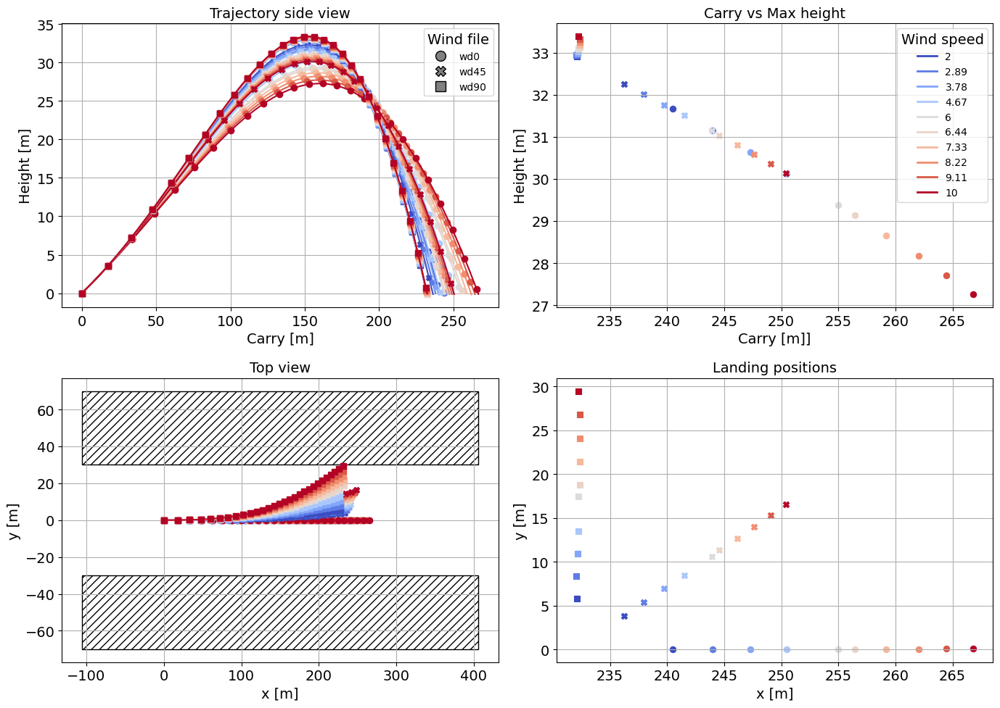

In [125]:
single_parameter_variation_combo('shot_speed')
single_parameter_variation_combo('shot_angle')
single_parameter_variation_combo('shot_spin')
single_parameter_variation_combo('U_ref')
#single_parameter_variation_combo('direction')
#single_parameter_variation_combo('playershift')

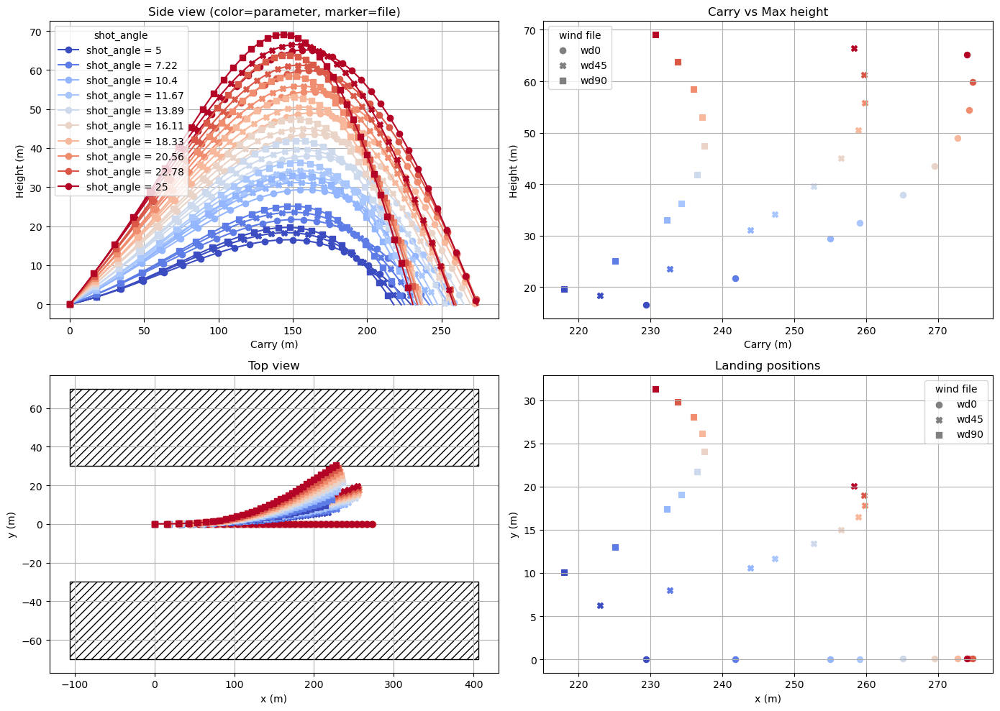

Saved CSV → single_param_combo_shot_angle.csv


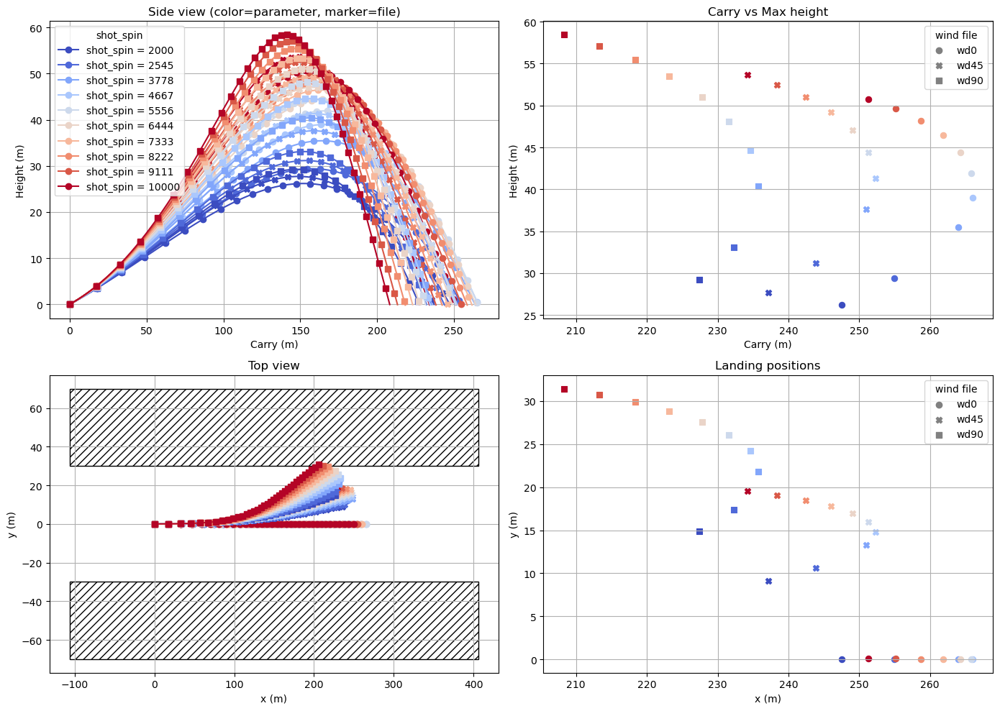

Saved CSV → single_param_combo_shot_spin.csv


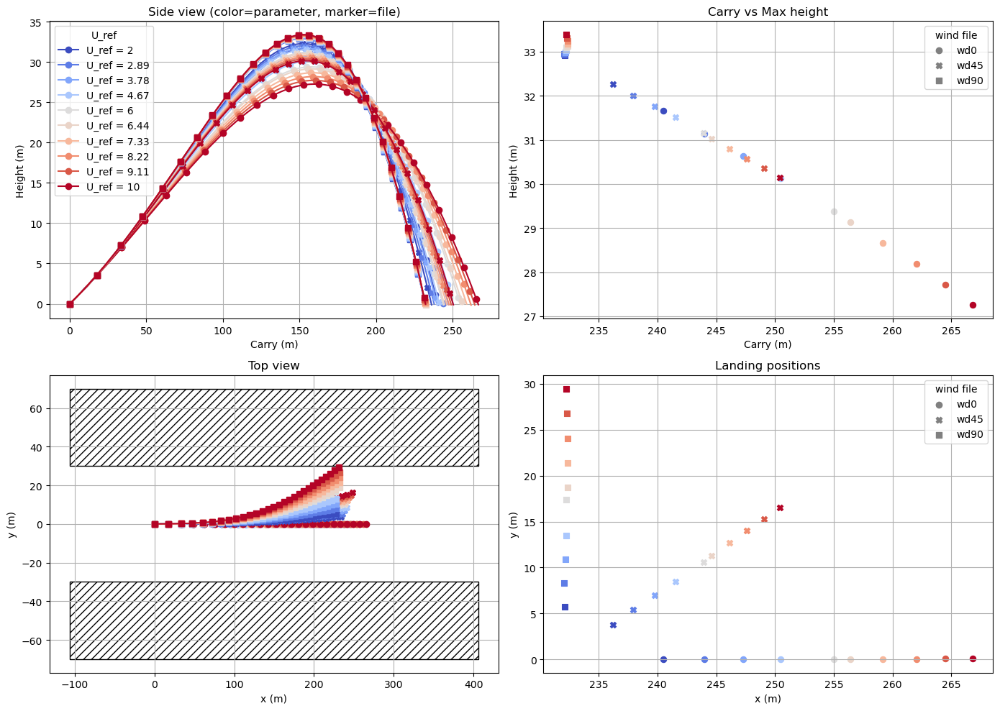

Saved CSV → single_param_combo_U_ref.csv


,filekey,U_ref,carry_m,max_height_m,landing_x_m,landing_y_m
0,wd0,2.000000,240.479762,31.664767,240.479762,0.013887
1,wd0,2.888889,243.975074,31.144128,243.975074,0.019446
2,wd0,3.777778,247.314511,30.631265,247.314511,0.024644
3,wd0,4.666667,250.499714,30.126088,250.499714,0.029495
4,wd0,6.000000,254.991891,29.382512,254.991891,0.036146
5,wd0,6.444444,256.413910,29.138401,256.413910,0.038202
6,wd0,7.333333,259.146139,28.655829,259.146139,0.042082
7,wd0,8.222222,262.031380,28.180606,262.031380,0.045744
8,wd0,9.111111,264.478341,27.712863,264.478341,0.049043
9,wd0,10.000000,266.780595,27.252387,266.780595,0.052065


In [ ]:
single_parameter_variation_combo_csv('shot_speed')
single_parameter_variation_combo_csv('shot_angle')
single_parameter_variation_combo_csv('shot_spin')
single_parameter_variation_combo_csv('U_ref')


## Single parameter variation with player shifting

### $\psi=0$

The following plots show the influence of player position within the corridor at $\psi=0^\circ$. Trajectories are calculated by varying one parameter for each player position within the corridor.

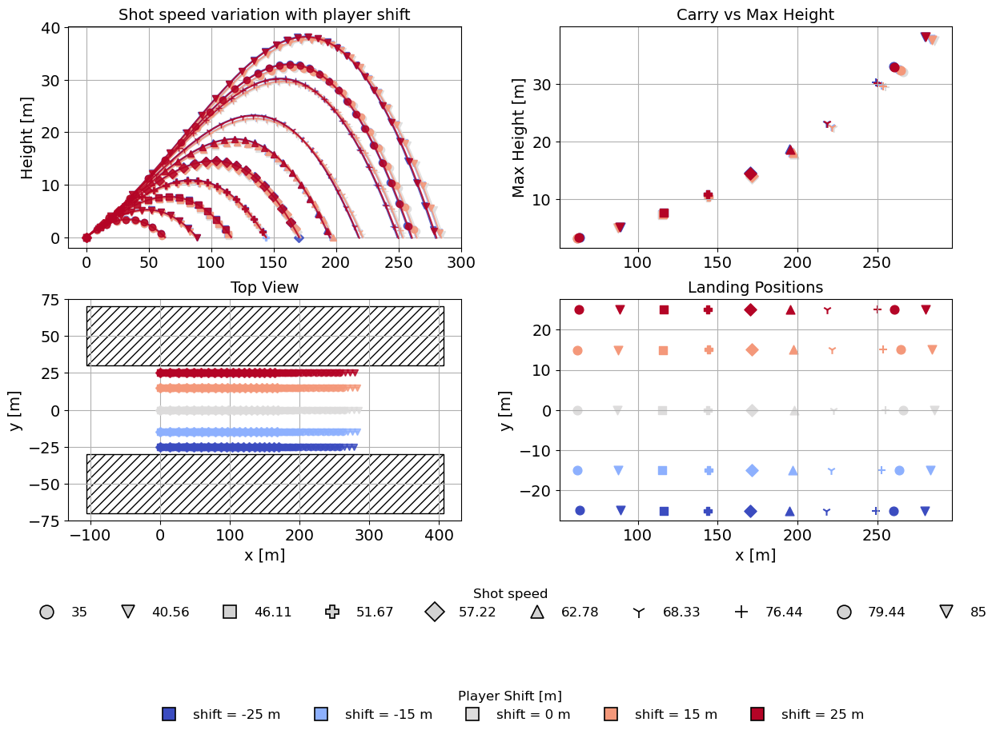

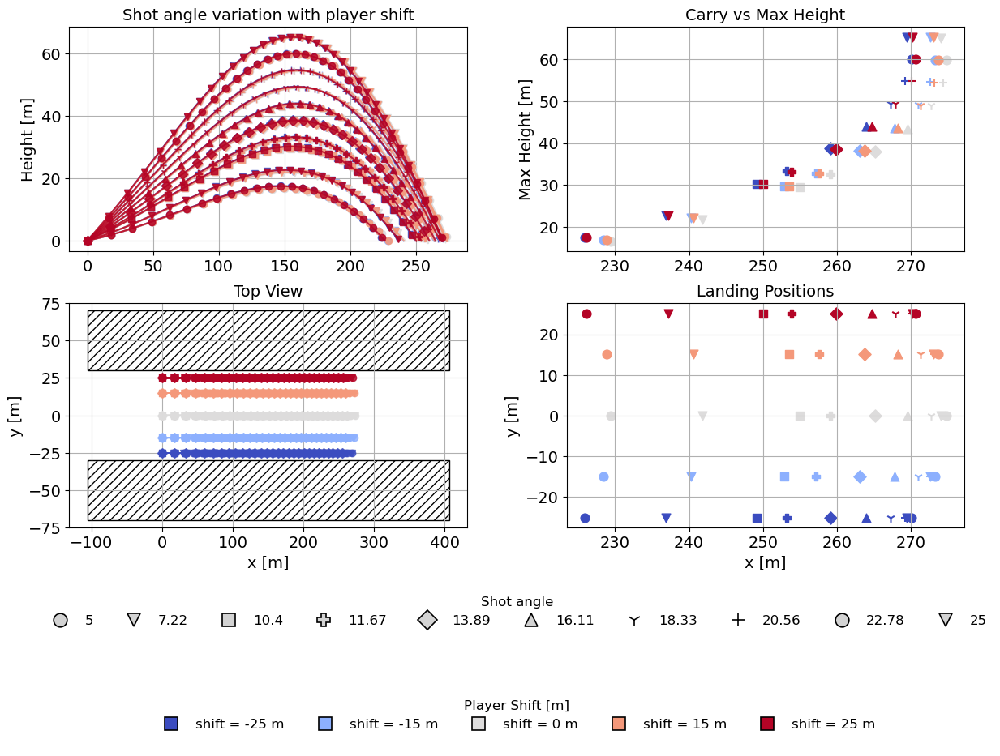

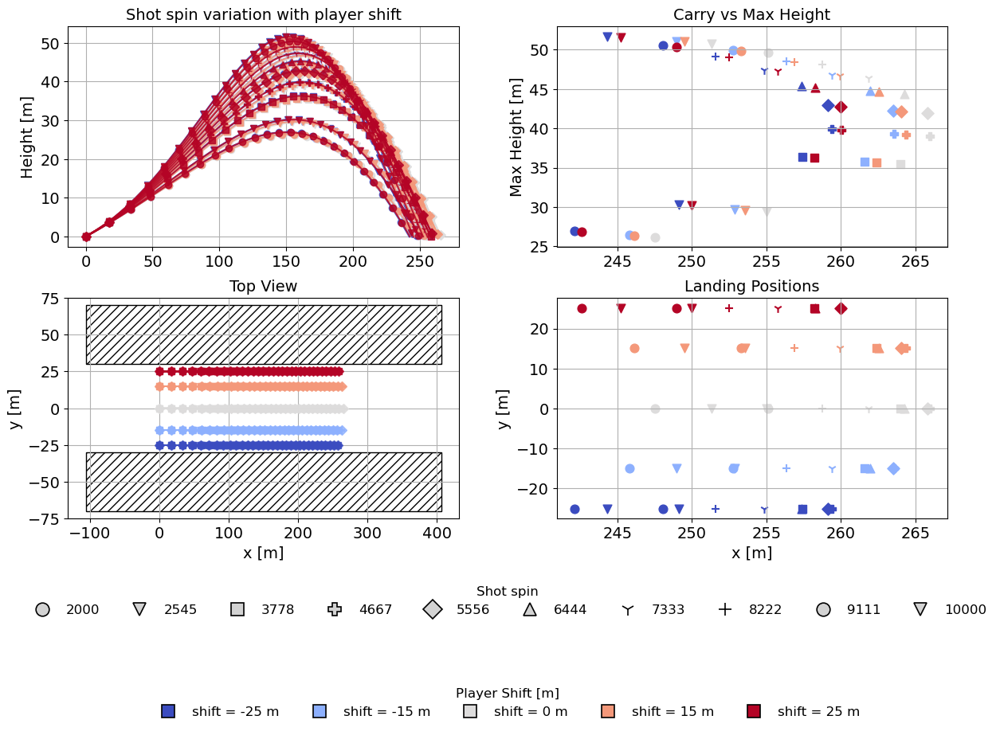

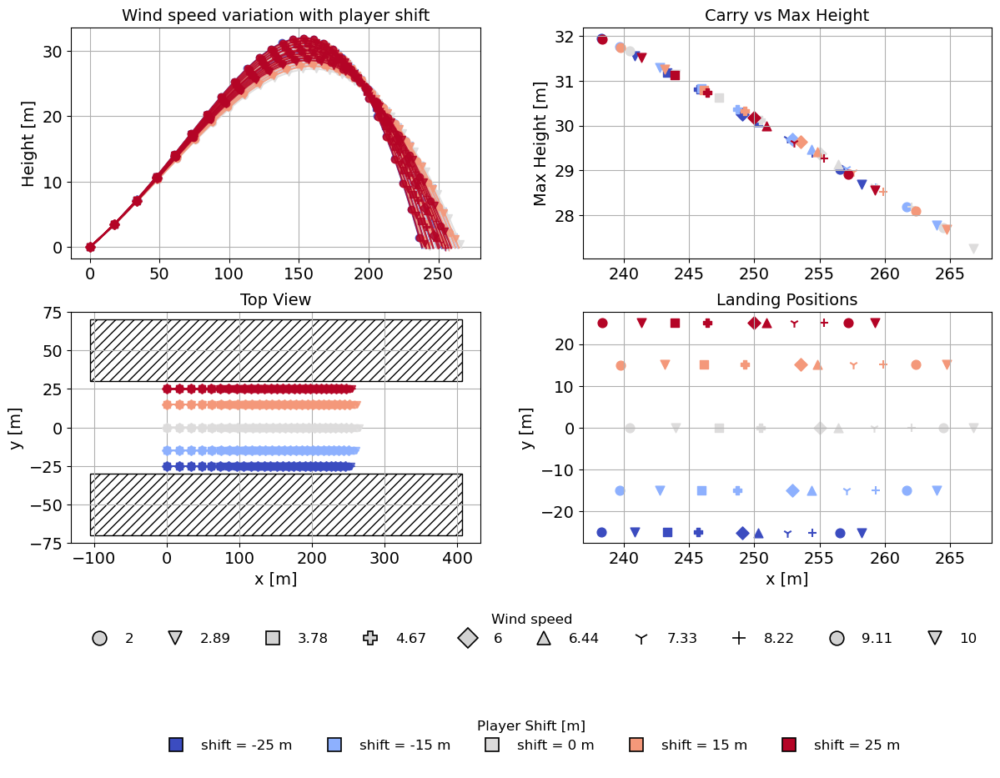

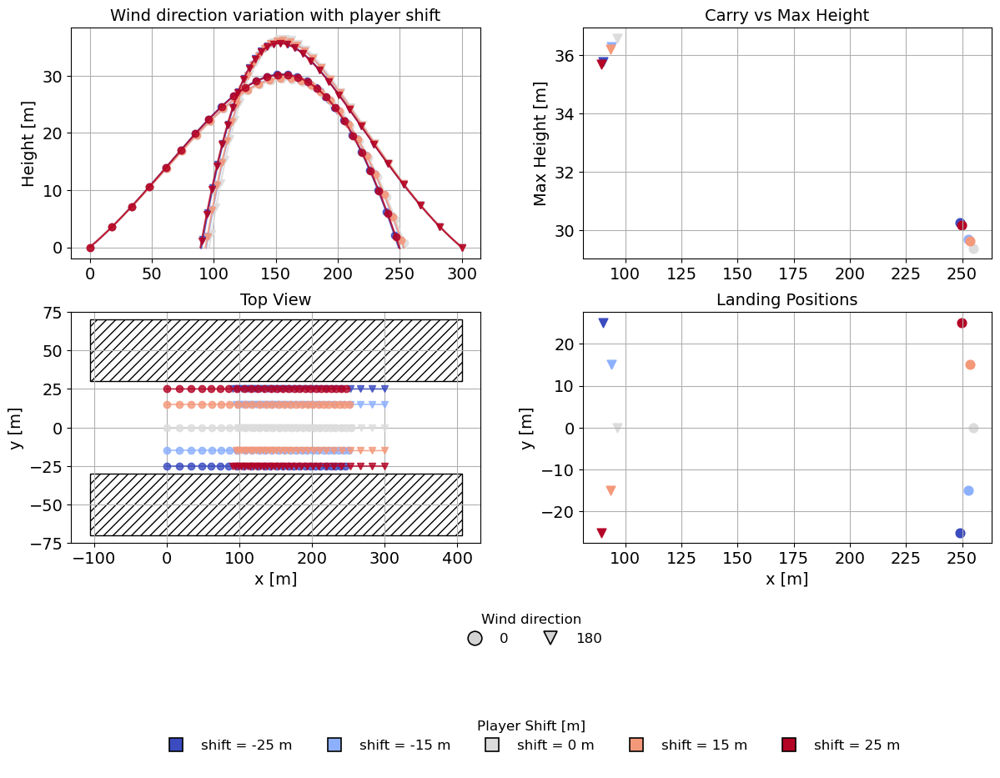

In [130]:
single_parameter_variation_shifter('shot_speed', filekey='wd0')
single_parameter_variation_shifter('shot_angle', filekey='wd0')
single_parameter_variation_shifter('shot_spin',  filekey='wd0')
single_parameter_variation_shifter('U_ref',      filekey='wd0')
single_parameter_variation_shifter('direction',  filekey='wd0')

### $\psi=45$

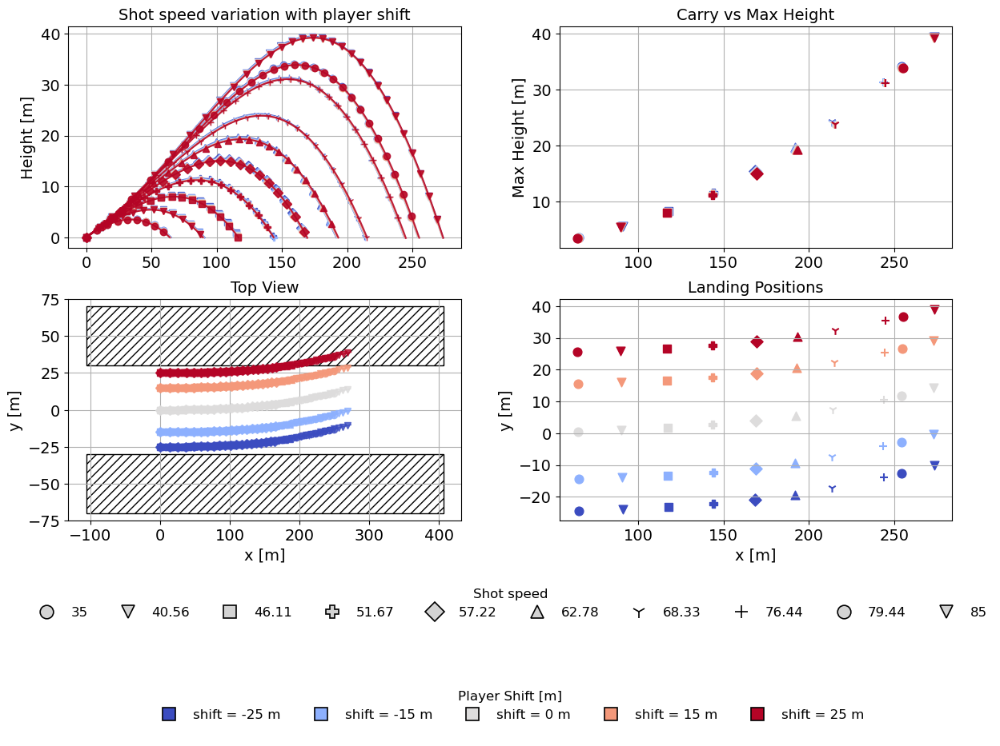

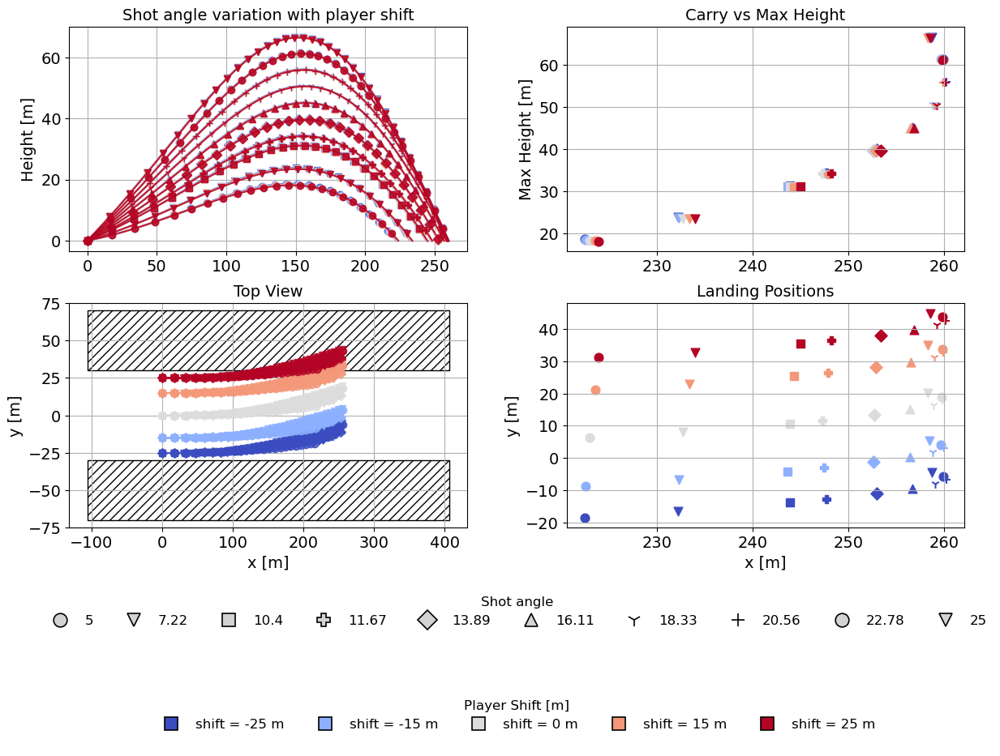

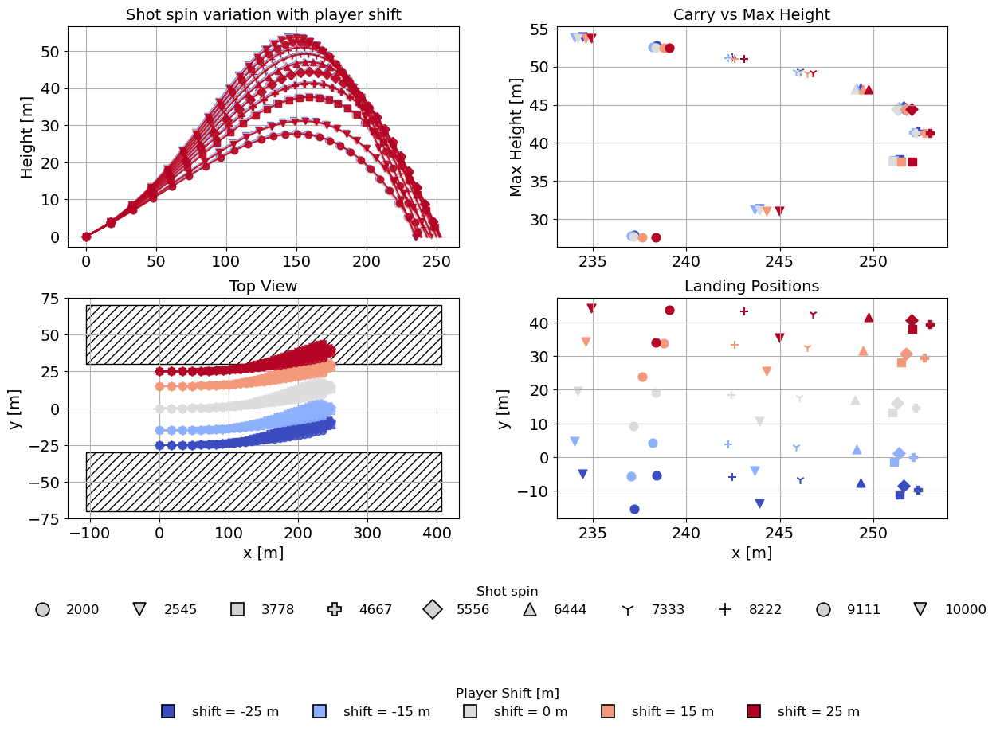

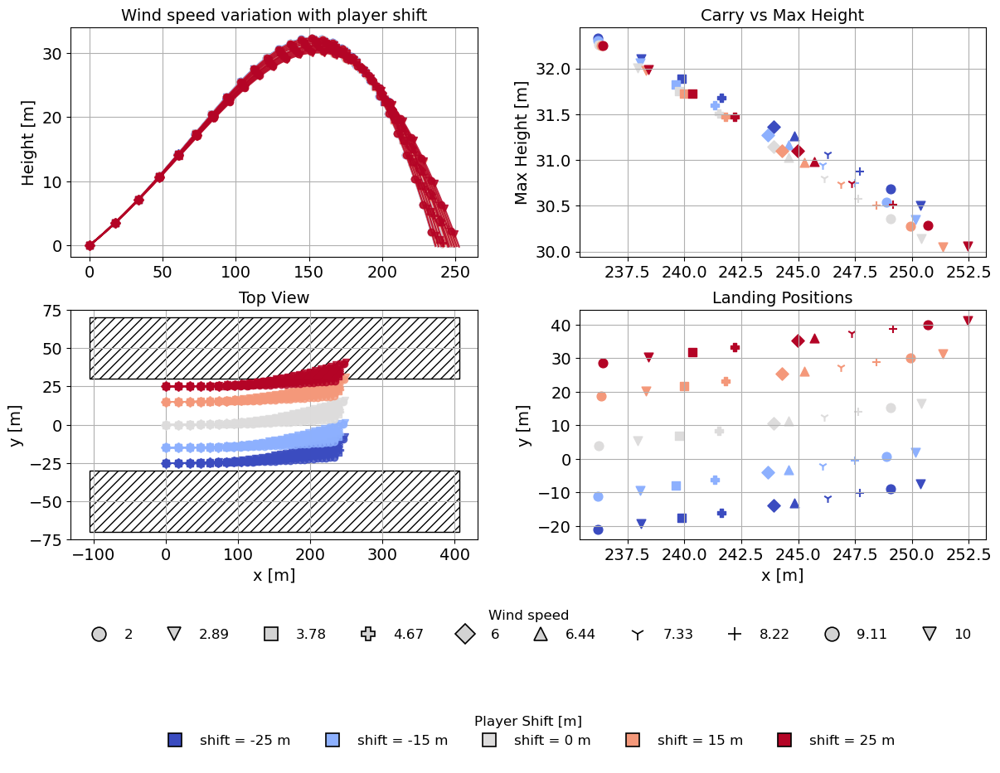

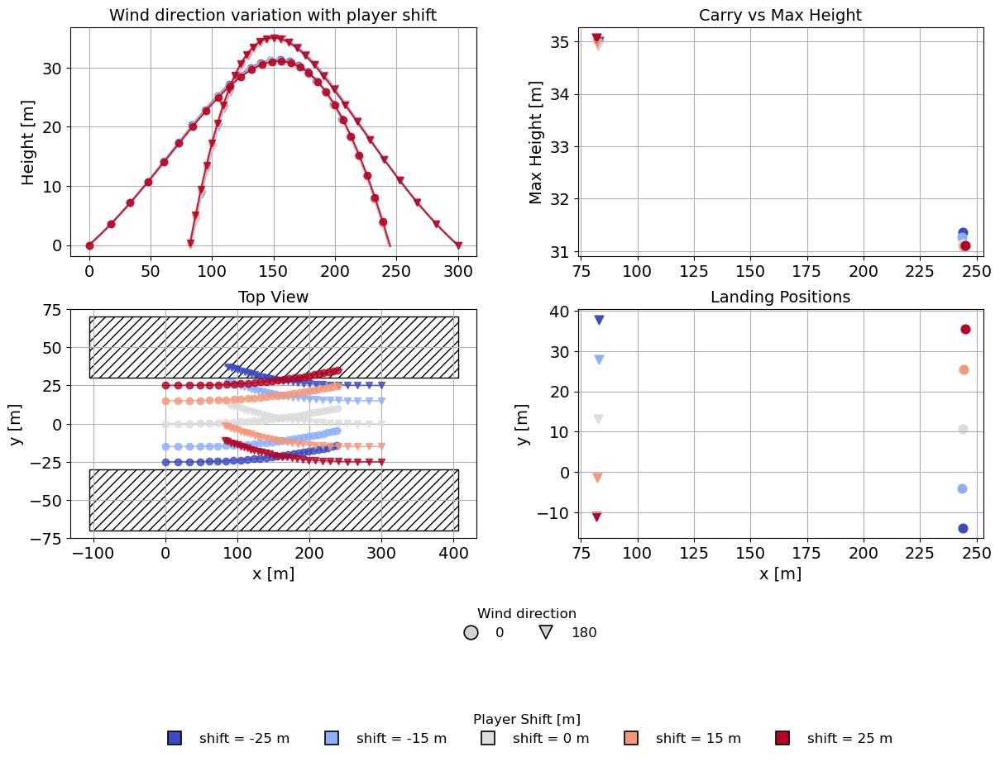

In [77]:
single_parameter_variation_shifter('shot_speed',filekey='wd45')
single_parameter_variation_shifter('shot_angle',filekey='wd45')
single_parameter_variation_shifter('shot_spin',filekey='wd45')
single_parameter_variation_shifter('U_ref',filekey='wd45')
single_parameter_variation_shifter('direction',filekey='wd45')

### $\psi=90$

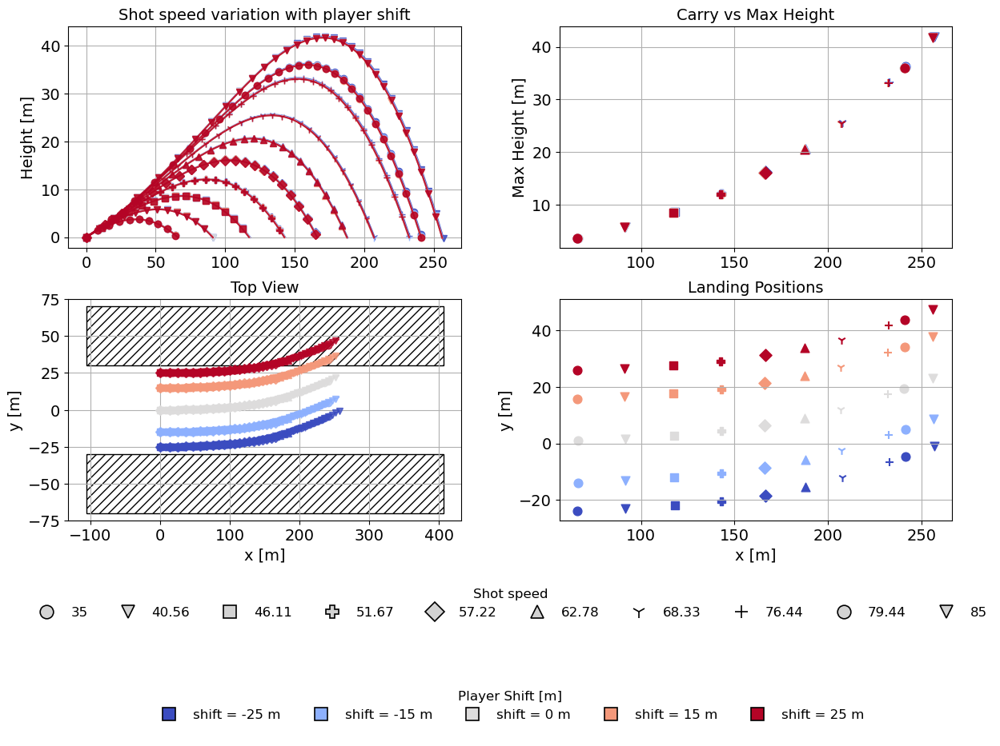

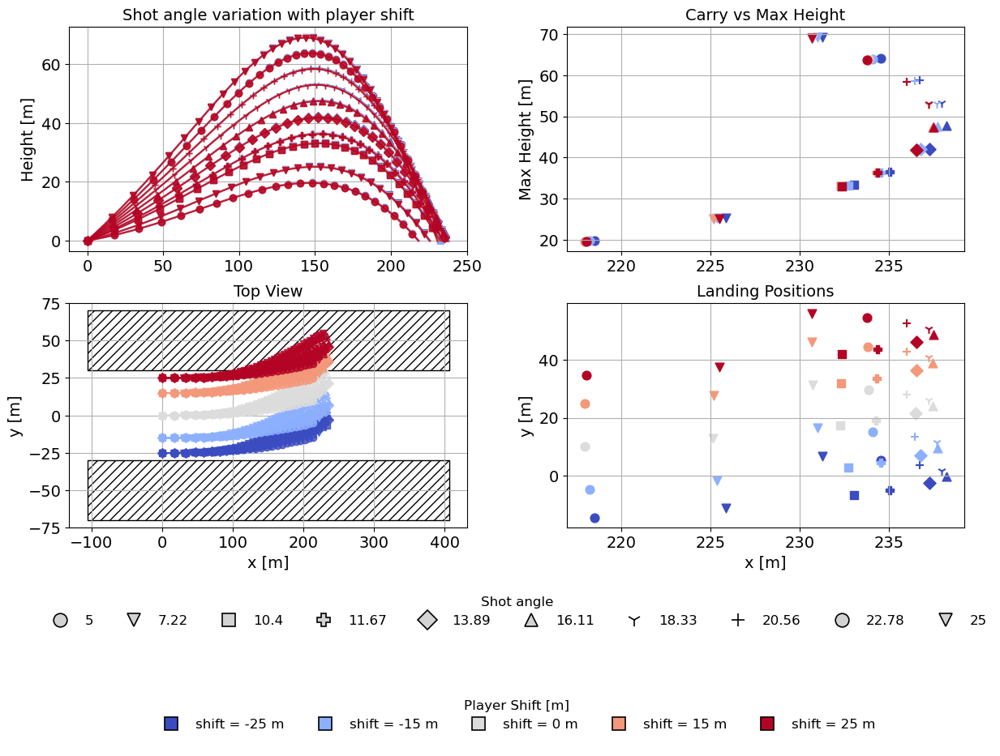

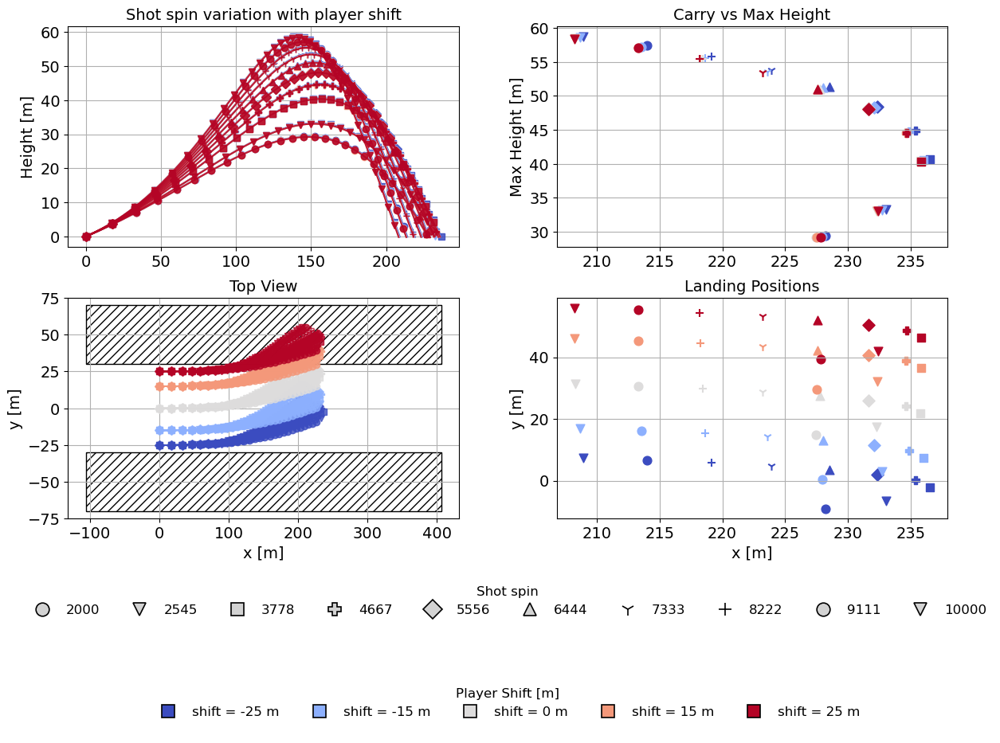

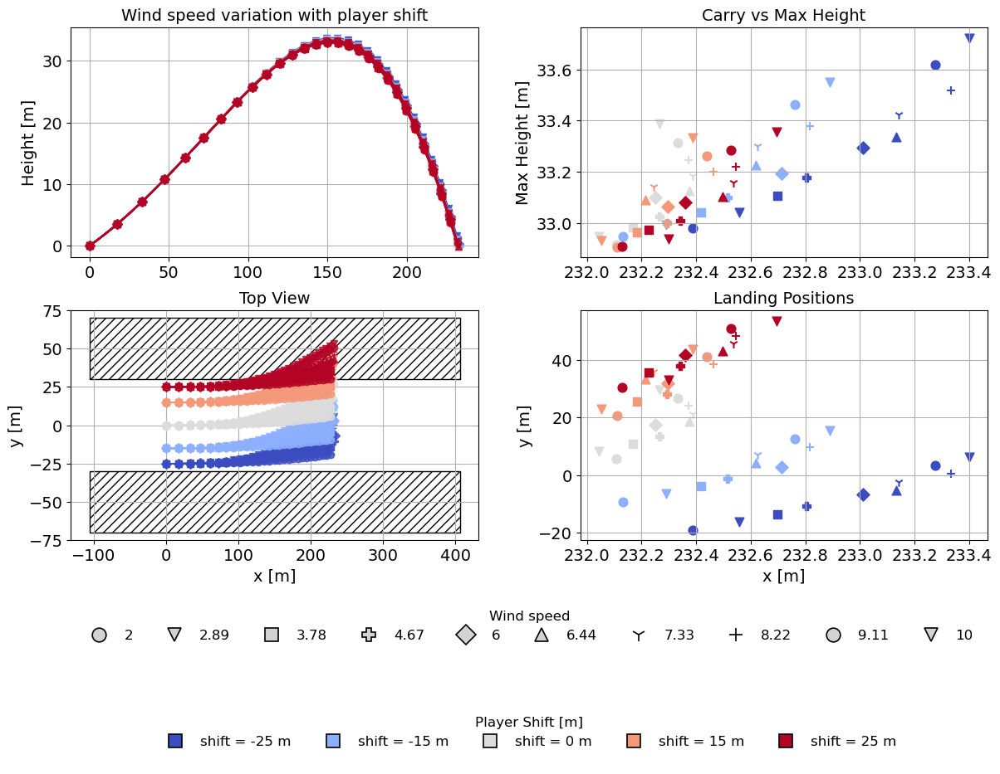

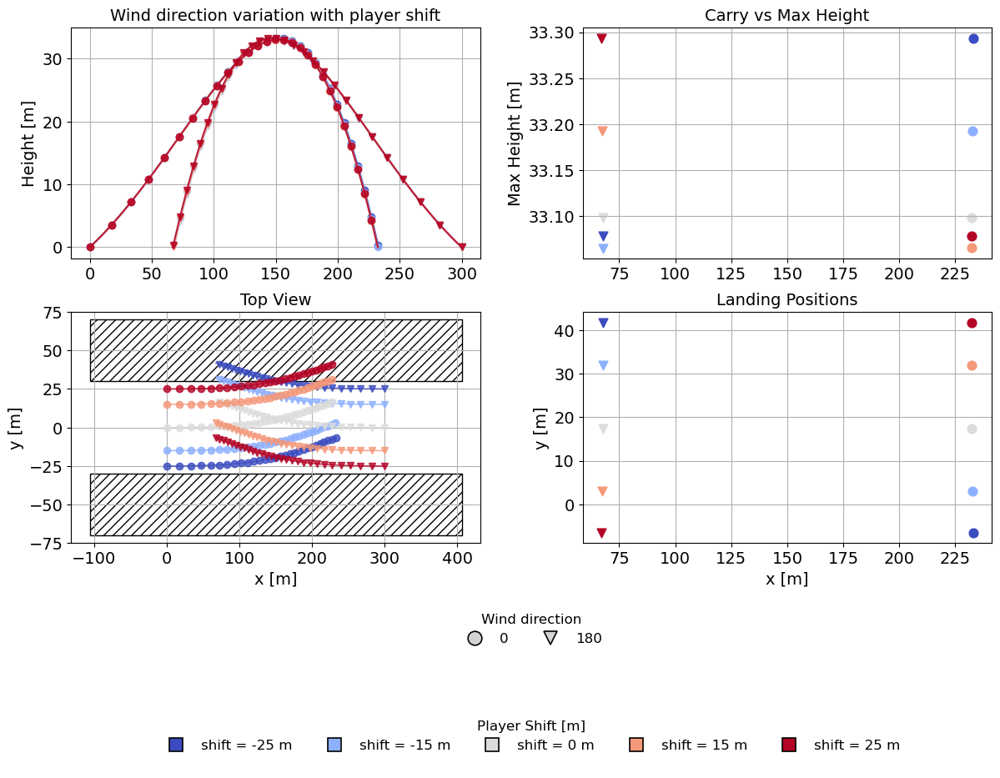

In [78]:
single_parameter_variation_shifter('shot_speed',filekey='wd90')
single_parameter_variation_shifter('shot_angle',filekey='wd90')
single_parameter_variation_shifter('shot_spin',filekey='wd90')
single_parameter_variation_shifter('U_ref',filekey='wd90')
single_parameter_variation_shifter('direction',filekey='wd90')

In [31]:
cwfwd90 = WindField('rans',ds=filepathwd90,U_ref=U_ref)

In [32]:
cwfwd90.get_profile_at(x=0,y=0,z=1)

(array([-1.91404599e-04,  2.13757340e+00,  1.49752807e-02]),
 0.57834541667026,
 0.06065130201354134)

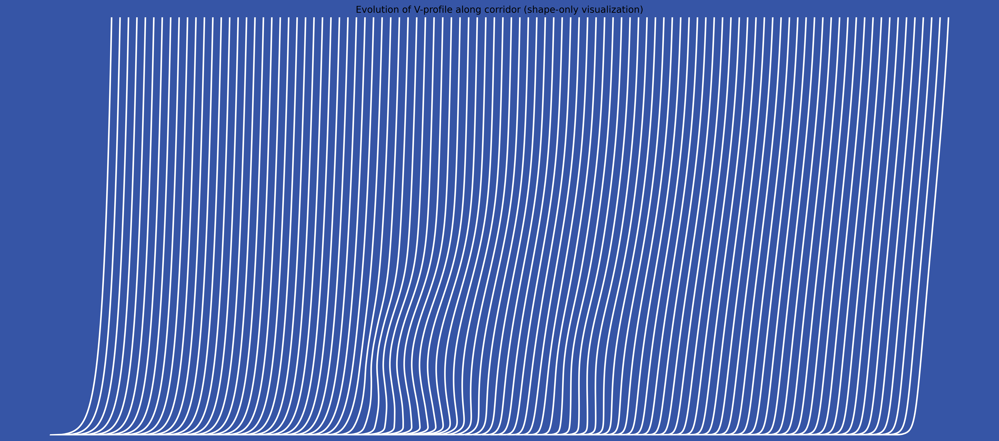

In [139]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# RANS file and standard conditions
# -----------------------------
filepath = filepathwd90
U_ref = 6
z0 = 0.03
wd = 270

rw = WindField(profile='rans', ds=filepath, U_ref=U_ref)

# -----------------------------
# Sampling locations
# -----------------------------
y_vals = np.linspace(-200,200, 100)
x_val = 100
z_vals = np.linspace(0.0001, 50, 1000)

# Storage
V_rans = np.zeros((len(y_vals), len(z_vals)))

# -----------------------------
# Compute profiles
# -----------------------------
for iy, y in enumerate(y_vals):
    for iz, z in enumerate(z_vals):

        vel_r, _, _ = rw.get_profile_at(x=x_val, y=y, z=z)
        V_rans[iy, iz] = vel_r[1]   # V-component

# -----------------------------
# Plot: profile fence (CORRECT WAY)
# -----------------------------
fig, ax = plt.subplots(figsize=(18, 8),dpi=500)
fig.patch.set_facecolor('#3655A6')
colors = plt.cm.plasma(np.linspace(0, 1, len(y_vals)))

for iy, y in enumerate(y_vals):

    # x = spatial position (y)
    # y-axis = height (z)
    #ax.plot(
    #    np.full_like(z_vals, y),  # constant x-position
    #    z_vals,
    #    linestyle='-',
    #    color=colors[iy],
    #    alpha=0.3
    #)

    # overlay velocity as small modulation (shape only)
    ax.plot(
        y + 30 * (V_rans[iy] / np.max(np.abs(V_rans))),  # shape only, scaled
        z_vals,
        color='white',
        linewidth=2,
        label=f"y = {y:.0f}"
    )


# -----------------------------
# Styling
# -----------------------------
ax.set_xlabel("y (m)")
ax.set_ylim(0,50)
ax.set_ylabel("z (m)")
ax.set_title("Evolution of V-profile along corridor (shape-only visualization)")
ax.axis('off')
#ax.grid(True)
plt.tight_layout()
plt.show()

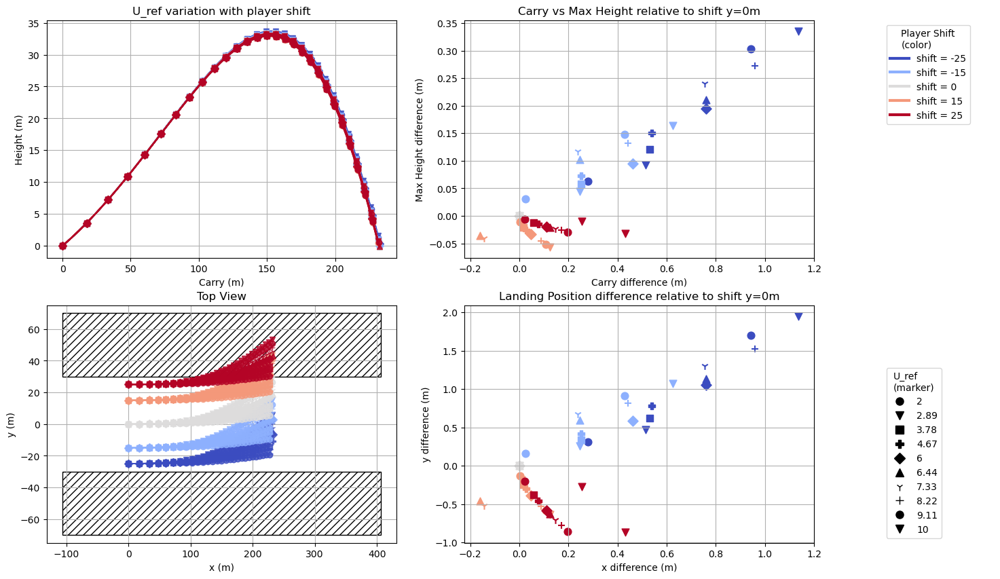

In [34]:
single_parameter_variation_shifter_difference('U_ref','wd90')

## Comparing corridor to flat

In [35]:
def compare_corridor_vs_flat(
    flat_csv_path,
    corridor_csv_path,
    param_key="parameter"
):
    # -------------------------------------------------
    # Load data
    # -------------------------------------------------
    df_flat = pd.read_csv(flat_csv_path)
    df_corr = pd.read_csv(corridor_csv_path)

    # -------------------------------------------------
    # Ensure wind label exists consistently
    # -------------------------------------------------
    # (your corridor CSV uses "filekey")
    # (flat CSV might or might not)
    if "filekey" not in df_flat.columns:
        df_flat["filekey"] = "flat"

    df_flat["terrain"] = "flat"
    df_corr["terrain"] = "corridor"

    df = pd.concat([df_flat, df_corr], ignore_index=True)

    # -------------------------------------------------
    # Color map for wind direction
    # -------------------------------------------------
    wind_keys = df["filekey"].unique()
    cmap = plt.cm.coolwarm
    color_norm = {k: cmap(i / (len(wind_keys) - 1 if len(wind_keys) > 1 else 1))
                  for i, k in enumerate(sorted(wind_keys))}

    # -------------------------------------------------
    # Marker map
    # -------------------------------------------------
    markers = {
        "flat": "X",
        "corridor": "o"
    }

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # =================================================
    # 1. Carry vs Max Height
    # =================================================
    for _, row in df.iterrows():

        axes[0].scatter(
            row["carry_m"],
            row["max_height_m"],
            color=color_norm[row["filekey"]],
            marker=markers[row["terrain"]],
            s=80,
            alpha=0.9
        )

    axes[0].set_xlabel("Carry (m)")
    axes[0].set_ylabel("Max height (m)")
    axes[0].set_title("Carry vs Max Height")
    axes[0].grid()

    # legend for terrain
    for t, m in markers.items():
        axes[0].scatter([], [], marker=m, color="gray", label=t)

    # legend for wind direction
    for k in sorted(wind_keys):
        axes[0].scatter([], [], color=color_norm[k], label=f"{k}")


    # =================================================
    # 2. Landing positions
    # =================================================
    for _, row in df.iterrows():

        axes[1].scatter(
            row["landing_x_m"],
            row["landing_y_m"],
            color=color_norm[row["filekey"]],
            marker=markers[row["terrain"]],
            s=80,
            alpha=0.9
        )

    axes[1].set_xlabel("Landing X (m)")
    axes[1].set_ylabel("Landing Y (m)")
    axes[1].set_title("Landing Positions")
    axes[1].grid()

    # terrain legend
    for t, m in markers.items():
        axes[1].scatter([], [], marker=m, color="gray", label=t)

    axes[1].legend(title="Terrain", loc="upper left")

    # wind legend
    for k in sorted(wind_keys):
        axes[1].scatter([], [], color=color_norm[k], label=f"{k}")

    axes[1].legend(title="Wind direction", loc="center left", bbox_to_anchor=(1.02, 0.5))

    plt.suptitle(f"Corridor vs Flat Terrain Comparison ({param_key})", fontsize=14)
    plt.tight_layout()
    plt.show()

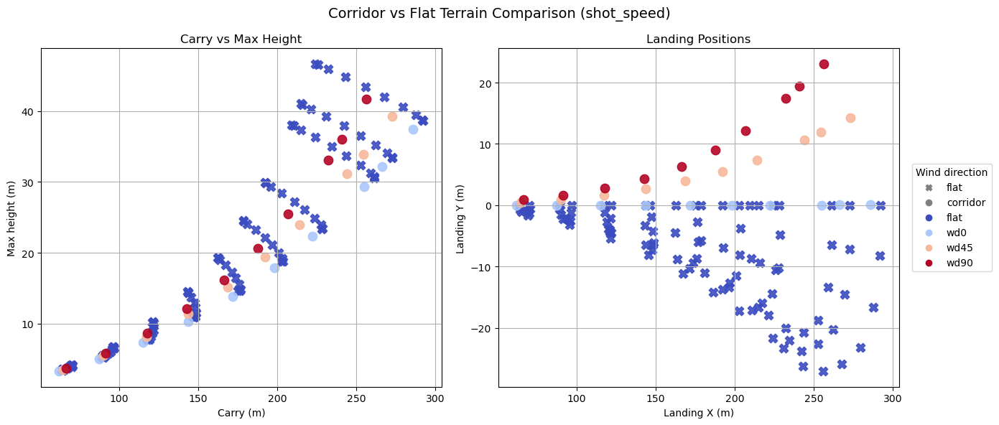

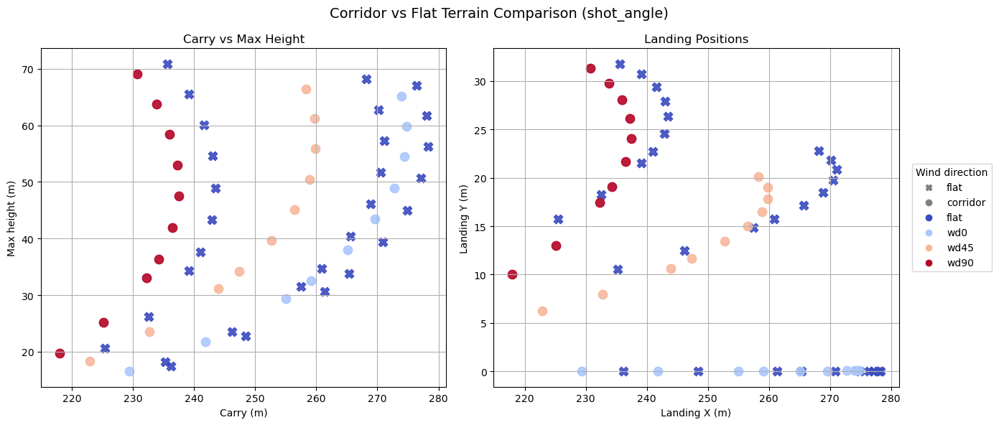

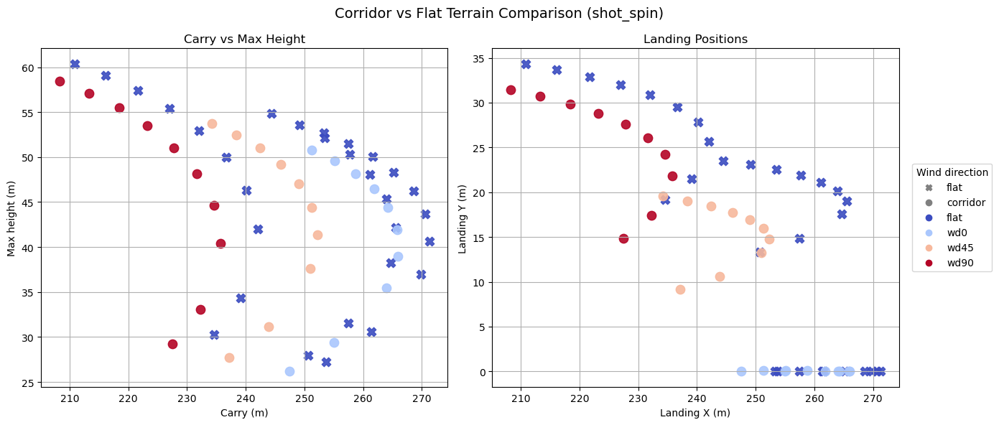

In [39]:
flat_csv_path_shotspeed = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\csv container\rans_shot_speed_vs_direction.csv'
flat_csv_path_shotangle = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\csv container\rans_shot_angle_vs_direction.csv'
flat_csv_path_shotspin = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\csv container\rans_shot_spin_vs_direction.csv'

corridor_csv_path_shotspeed = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\single_param_combo_shot_speed.csv'
corridor_csv_path_shotangle = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\single_param_combo_shot_angle.csv'
corridor_csv_path_shotspin = r'C:\Users\allpe\OneDrive\Skrivebord\DTU\Bachelorprojekt\Bachelor_legeplads\demos\single_param_combo_shot_spin.csv'

compare_corridor_vs_flat(flat_csv_path_shotspeed,corridor_csv_path_shotspeed,param_key='shot_speed')
compare_corridor_vs_flat(flat_csv_path_shotangle,corridor_csv_path_shotangle,param_key='shot_angle')
compare_corridor_vs_flat(flat_csv_path_shotspin,corridor_csv_path_shotspin,param_key='shot_spin')

## Visualisation for niels

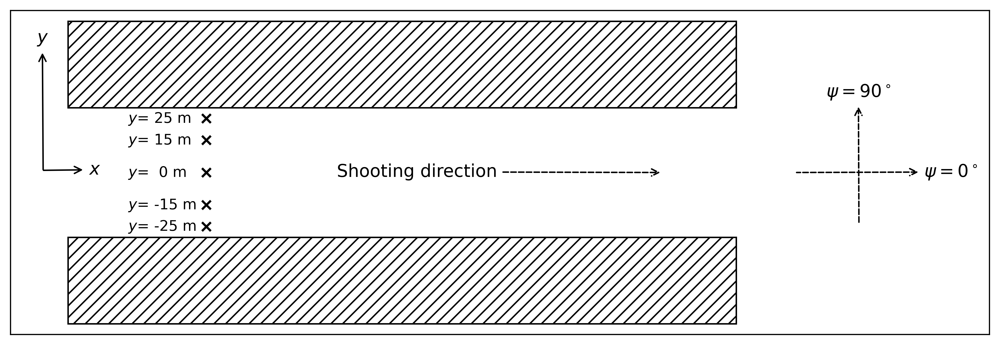

In [132]:
plt.figure(figsize=(12, 4),dpi=500)

c1, c2 = make_corridors()

pointlist = np.array([-25,-15,0,15,25])
label_list = ['$y$= -25 m', '$y$= -15 m', '$y$=  0 m', '$y$= 15 m', '$y$= 25 m']
x = np.array([0,0,0,0,0])
plt.gca().add_patch(c1)
plt.gca().add_patch(c2)
plt.scatter(x,pointlist,marker = 'x', color='black')
for i, y in enumerate(pointlist):
    plt.text(x[i] - 60, y-2, f"{label_list[i]}", fontsize=10)

plt.annotate(
    "Shooting direction",
    xy=(350, 0),        # END of arrow
    xytext=(100, -2),   # START of arrow (text position side)
    arrowprops=dict(
        arrowstyle="->",
        linestyle="--",
        lw=1
    ),
    fontsize=12
)

plt.annotate(
    "$y$",
    xy=(-125, 0),        # END of arrow
    xytext=(-130, 60),   # START of arrow (text position side)
    arrowprops=dict(
        arrowstyle="<-",
        lw=1
    ),
    fontsize=12
)

plt.annotate(
    "$x$",
    xy=(-127, 1),        # END of arrow
    xytext=(-90, -1),   # START of arrow (text position side)
    arrowprops=dict(
        arrowstyle="<-",
        lw=1
    ),
    fontsize=12
)

plt.annotate(
    r"$\psi=0^\circ$",
    xy=(450, 0),        # END of arrow
    xytext=(550, -2),   # START of arrow (text position side)
    arrowprops=dict(
        arrowstyle="<-",
        linestyle='--',
        lw=1
    ),
    fontsize=12
)
plt.annotate(
    r"$\psi=90^\circ$",
    xy=(500, -25),        # END of arrow
    xytext=(475, 35),   # START of arrow (text position side)
    arrowprops=dict(
        arrowstyle="<-",
        linestyle='--',
        lw=1
    ),
    fontsize=12
)



plt.xlim(-150,600)
plt.ylim(-75,75)
plt.xticks([])
plt.yticks([])
plt.show()